# **Detección y Clasificación Automática de Tableros de Ajedrez para la Generación de Notación FEN mediante Redes Neuronales Convolucionales**

Autores:

- Pablo Gálvez Ortigosa
- Eduardo Rodríguez Cao
- José Luís Mera Cardoso
- Mario Megías Mateo

# 0. Carga de librerías y de funciones auxiliares

In [ ]:
# Ahora configuramos Fastai
!pip install -Uqq fastbook
!pip install nbdev
import fastbook
fastbook.setup_book()
import fastai
import fastcore
print(f'fastcore version {fastcore.__version__} installed')
print(f'fastai version {fastai.__version__} installed')
from nbdev.showdoc import *
from fastai.vision.all import *

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 kB 14.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 21.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 13.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 11.1 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.3/44.3 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.1/69.1 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━

In [ ]:
# Load the Drive helper and mount
from google.colab import drive

# This will prompt for authorization.
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install chess

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 156.5/156.5 kB 3.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for chess: filename=chess-1.11.1-py3-none-any.whl size=148497 sha256=b4d1e341dd7e530159a16f9b2225b4bdd4245f358349f71898fafdaeb76dfa73
  Stored in directory: /root/.cache/pip/wheels/2e/2d/23/1bfc95db984ed3ecbf6764167dc7526d0ab521cf9a9852544e
Successfully built chess


In [ ]:
!pip install recap

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import cv2
import os
import glob
import chess
import shutil
import typing
import json

from sklearn.metrics import f1_score, precision_score, recall_score
from fastai.metrics import accuracy
from matplotlib import pyplot as plt
from sklearn.metrics.pairwise import pairwise_distances
from sklearn.cluster import AgglomerativeClustering, DBSCAN
from pathlib import Path
from pprint import pprint
from PIL import Image, ImageDraw, ImageFont
from recap import URI

In [ ]:
# Definimos el path del proyecto
path = Path('/content/drive/My Drive/Colab Notebooks/VC/Proyecto')

In [ ]:
'''
This function receives a string with the filename of the image to read,
and a flag indicating if we want to read it in color/RGB (flagColor=1) or gray level (flagColor=0)

Example of use:
im1=readIm(get_image('apple.jpg'),0)

'''
def readIm(filename, flagColor=1):
  # cv2 reads BGR format
  im=cv2.imread(filename)
  # change to  RGB and return the image
  if(flagColor):
    return cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
  # change from BGR to grayscale instead if flag is 0
  return cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)


'''
This function receives an array of arbitrary real numbers (that could include even negative values),
and returns an 'image' in the range [0,1].
flag_GLOBAL allows the user to normalize the whole image (including all channels) or to normalize
each channel/band independently.
'''
def rangeDisplay01(im, flag_GLOBAL= True):
  im = im.astype(float)
  if flag_GLOBAL:
    im = (im - im.min())/(im.max() - im.min())
  else:
    # bands normalization
    for band in range(im.shape[2]):
      im[:, :, band] = (im[:, :, band] - im[:, :, band].min())/(im[:, :, band].max() - im[:, :, band].min())
      # Note: remember that, for plt.imshow with RGB data, the valid range is [0..1] for floats and [0..255] for integers.
  return im


'''
This function displays a single image, including a title, using a magnification factor.

Example of use:
im1=readIm(get_image('apple.jpg'),0)
displayIm(im1,'Manzana',0.5)

'''
def displayIm(im, title='Result',factor= 2):
  # First normalize range
  max=np.max(im)
  min=np.min(im)
  if min<0 or max>255:
    im=rangeDisplay01(im,flag_GLOBAL=True)
  if len(im.shape) == 3:
    # im es tribanda
    plt.imshow(im, cmap='jet')
  else:
    # im es monobanda
    plt.imshow(im, cmap='gray')
  figure_size = plt.gcf().get_size_inches()
  plt.gcf().set_size_inches(factor * figure_size)
  plt.title(title)
  plt.xticks([]), plt.yticks([]) # eliminamos numeración
  plt.show()


'''
This function displays multiple images (including a title and using a magnification factor)
of equal size. The input to the function is a list of images.

Example of use:
im1=readIm(get_image('apple.jpg'),1)
images = [im1,im1,im1]

displayMI_ES(images, title='Manzanas',factor=1)

IMPORTANT NOTE: it is important to notice that this function stacks all images
and later call displayIm(). This implies that the normalization (rangeDisplay01()) is done
at the very end of the process. As a consequence, if the stacked images have different
range values they can be displayed in a "weird" way (with black regions (pixel value = 0)
looking grey). In case the visualization seems to be a problem, a possible solution
would be to create vim using vim.append(rangeDisplay01(...)). In this way, all images
would be on the same range of values (negative values around 0 (black),
0 values around 0.5 (grey), and positive values closer to 1 (white))

'''
def displayMI_ES(vim, title='Result',factor=2):
  # We set the maximun number of images to concatenate by columns
  maxcolumns=3
  # number of images to display
  numberim=len(vim)
  # The simplest case, one row: the maximum number of columns is larger than the images to stack
  # This is, by default, we put together the images column-wise
  if len(vim) < maxcolumns:
    out=vim[0]
    for item in range(1,len(vim)):
      #displayIm(out,str(item),1)
      out=np.hstack((out,vim[item]))

  # Else, if maxcolumns is smaller or equal than the number of images to stack
  else:
    # We check if all rows and columns are going to be 'busy', or if otherwise we need an extra-row
    if np.mod(len(vim),maxcolumns)== 0:
      maxrows=numberim//maxcolumns
    else:
      maxrows=numberim//maxcolumns+1

    # we build up the first block-row
    out=vim[0]
    for item in range(1,maxcolumns):
      out=np.hstack((out,vim[item]))
    # We build up the rest of block-rows
    for block in range(1,maxrows):
      #print(block)
      row=vim[block*maxcolumns]
      for item in range(1,maxcolumns):
        # We still have images to stack
        if block*maxcolumns+item < numberim:
          row=np.hstack((row,vim[block*maxcolumns+item]))
        # We do not have more images, and we have to fill with black
        else:
          row=np.hstack((row,np.zeros(vim[0].shape,dtype=vim[0].dtype)))
          #print(row.dtype)
          # if we don't include ',dtype=vim[0].dtype', np.zeros will include float
          # numbers in the matrix. This will make that the whole matrix will be
          # considered as floats, and values larger than 1 will be clipped to 1,
          # displaying an almost totally white image
      # add the new block-row
      out=np.vstack((out,row))
  return displayIm(out,title,factor)

In [ ]:


def compute_metrics(learn, dataloaders, names_dl=['train', 'valid']):
    """
    Calcula métricas (accuracy, F1-score, precision, and recall) para una lista dada de dataloaders.

    Args:
        learn: El objeto Learner de fastai.
        names_dl (lista de str): Nombres correspondientes a cada dataloader (por ejemplo, ['train', 'valid', 'test']).
        dataloaders (lista de DataLoader): Lista de dataloaders (por ejemplo, [train_dl, valid_dl, test_dl]).

    Returns:
        dict: Un diccionario que contiene predicciones, targets, accuracy, F1-score, precision y recall para cada dataloader.
    """

    results_dict = {}

    for name_dl, dl in zip(names_dl, dataloaders):
        # Obtiene las predicciones y las true label
        preds, targs, _ = learn.get_preds(dl=dl, with_decoded=True)

        # Obtenemos los índices/clases de las predicciones
        preds_decoded = preds.argmax(dim=1)

        # Calculamos accuracy
        acc = accuracy(preds, targs)

        # Calculamos weighted F1-score
        f1 = f1_score(targs, preds_decoded, average='weighted')

        # Calculamos precision y recall (weighted)
        precision = precision_score(targs, preds_decoded, average='weighted')
        recall = recall_score(targs, preds_decoded, average='weighted')

        # Guardamos los resultados
        results_dict[name_dl] = {
            # 'predictions': preds_decoded,
            # 'targets': targs,
            'accuracy': acc.item(),
            'f1-score-w': f1,
            'precision-w': precision,
            'recall-w': recall
        }

    return results_dict


def print_metrics(results):
    """
    Imprime los resultados de las métricas con cinco decimales.

    Args:
        results (dict): Diccionario con los resultados generados por la función compute_metrics.
                        Contiene 'accuracy', 'f1-score-w', 'precision-w' y 'recall-w' para cada dataloader.
    """

    for name, metrics in results.items():
        print(f"Métricas para {name}:")
        print(f"  Accuracy: {metrics['accuracy']:.5f}")
        print(f"  F1-score (weighted): {metrics['f1-score-w']:.5f}")
        print(f"  Precision (weighted): {metrics['precision-w']:.5f}")
        print(f"  Recall (weighted): {metrics['recall-w']:.5f}")


# 1. Introducción

En este trabajo abordamos un problema de visión por computador que consiste en **identificar la configuración que siguen las piezas de ajedrez de un tablero (en notación FEN) a partir de una imagen del mismo**.

La resolución de este problema trae consigo númerosas aplicaciones en el ámbito del juego del ajedrez:

- Robots de ajedrez.
- Software de registro de movimientos de ajedrez.
- Análisis de partidas de ajedrez.

Todo ello **sin el coste de introducir manualmente la información sobre la posición de las piezas** en cada estado del juego. Por tanto, un sistema capaz de convertir una imagen de un tablero de ajedrez en un formato estructurado compatible con motores de ajedrez, como la **notación Forsyth-Edwards (FEN)**, ampliamente utilizada, puede automatizar este tipo de tareas laboriosas.

La notación FEN es un sistema para describir la posición de las piezas en un tablero de ajedrez, compuesto por seis campos separados por espacios. La primera parte de la notación representa la disposición de las piezas fila por fila, comenzando desde la fila 8 hasta la fila 1, utilizando letras para las piezas: P para peón, N para caballo, B para alfil, R para torre, Q para dama y K para rey. Las piezas blancas se indican con letras mayúsculas y las negras con minúsculas, mientras que los espacios vacíos se representan con números que indican cuántas casillas están vacías. Por ejemplo, "rnbqkbnr" representa la fila 8 con las piezas negras en su posición inicial.

Para poder llevar a cabo esta tarea, se va a desarrollar un sistema de visión por computador que **combina tanto técnicas clásicas como otras basadas en deep learning**. El sistema actúa en tres etapas consecutivas:

1. Localización del tablero dentro de la imagen.
2. Clasificación de las casillas del tablero según si están ocupadas o no.
3. Clasificación de las piezas de ajedrez que se encuentran en las casillas ocupadas, según el tipo de pieza y el color.

El sistema localiza el tablero de ajedrez utilizando un algoritmo basado en **RANSAC**, que calcula una transformación proyectiva u **homografía** del tablero hacia una malla, obteniendo el tablero visto desde arriba. Luego, emplea **dos redes neuronales convolucionales** para predecir la ocupación de las casillas en la imagen deformada y, finalmente, clasifica las piezas.






# 2. Dataset

## 2.1 Visualización de un ejemplo del dataset

En primer lugar abrimos el archivo JSON asociado a una imagen para mostrar un ejemplo del tipo de tableros que se pueden encontrar en el dataset de imágenes sintéticas con el que trabajamos.

In [ ]:
# Load the JSON file
with open(path/'0378.json', 'r') as f:
    data = json.load(f)

# Pretty-print the JSON data
pprint(data)

{'camera': {'angle': 55,
            'location': [-0.0415320098400116,
                         0.2271362692117691,
                         0.3243842124938965]},
 'corners': [[884, 229], [901, 744], [203, 613], [415, 172]],
 'fen': '8/2r1k1p1/7p/2P1p2P/3nN1K1/2R2PP1/8/8',
 'lighting': {'flash': {'active': False},
              'mode': 'spotlights',
              'spot1': {'active': True,
                        'focus': [-0.5280119180679321,
                                  0.044994063675403595,
                                  0.0],
                        'location': [-0.31486308574676514,
                                     -0.1745314598083496,
                                     0.21156975626945496],
                        'xy_angle': 209},
              'spot2': {'active': True,
                        'focus': [-0.11852378398180008,
                                  -0.26794227957725525,
                                  0.0],
                        'location': [0.34238034

En esta celda definimos una serie de funciones que nos van a permitir visualizar el tablero marcando alguno de los detalles importantes para el trabajo que vamos a realizar como es el caso de los bordes del tablero y de los distintos tipos de piezas que hay en el tablero que hemos seleccionado previamente.

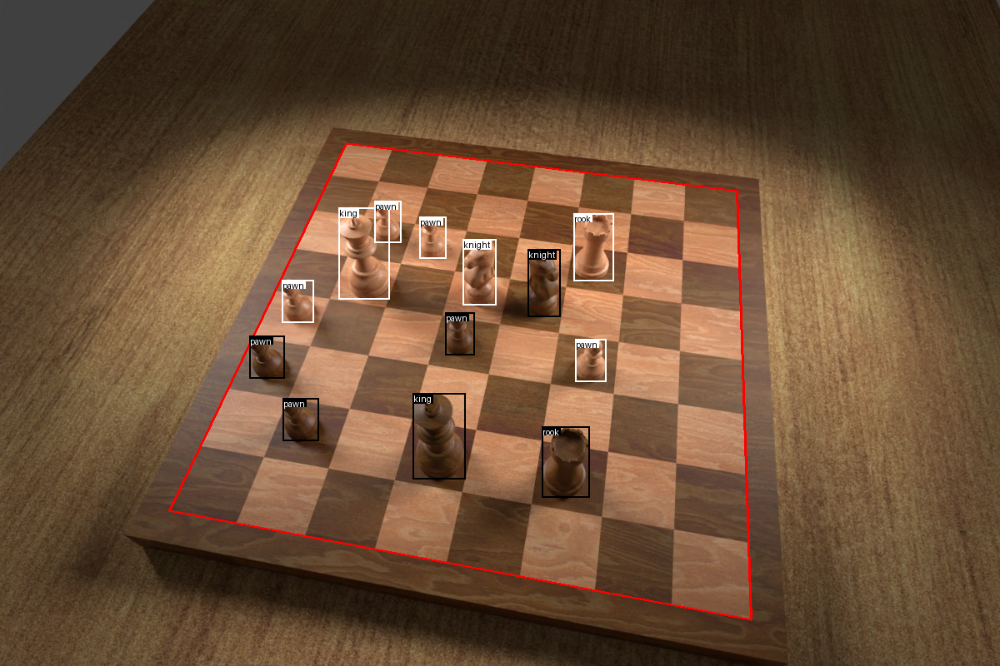

In [ ]:
"""Script to visualize the image and labels for a sample from the dataset.

.. code-block:: console

    $ python -m chesscog.data_synthesis.visualize --help
    usage: visualize.py [-h] [--file FILE]

    Visualize a sample from the dataset.

    optional arguments:
      -h, --help   show this help message and exit
      --file FILE  path to image file
"""

def _draw_board_edges(img: Image, corners: typing.List[typing.List[int]]):
    draw = ImageDraw.Draw(img)
    corners = list(map(tuple, corners))
    corners.append(corners[0])
    draw.line(corners, "red", width=3)


def _draw_bounding_boxes(img: Image, pieces: list):
    try:
        font = ImageFont.truetype('arial.ttf', 50)
    except IOError:
        font = ImageFont.load_default()

    # First, draw the bounding boxes
    labels_to_draw = list()
    for piece in pieces[::-1]:
        draw = ImageDraw.Draw(img)
        name = piece["piece"]
        box = (x, y, w, h) = piece["box"]

        color = "white" if name.isupper() else "black"
        draw.rectangle([x, y, x+w, y+h], outline=color, width=2)

        labels_to_draw.append((name, box, color))

    # Draw each bounding box's label in the top left
    for name, (x, y, w, h), outline_color in labels_to_draw:
        draw = ImageDraw.Draw(img)
        text_color = {
            "black": "white",
            "white": "black"
        }[outline_color]

        text = {
            "P": "pawn",
            "N": "knight",
            "B": "bishop",
            "R": "rook",
            "Q": "queen",
            "K": "king"
        }[name.upper()]

        # text_width, text_height = font.getbbox(text)[2:]

        bbox = font.getbbox(text)
        text_width = bbox[2] - bbox[0]  # Width
        text_height = bbox[3] - bbox[1]  # Height

        margin = np.ceil(0.05 * text_height)
        draw.rectangle(
            (x,
             y,
             x + text_width + 2 * margin,
             y + text_height + 2 * margin),
            fill=outline_color
        )
        draw.text(
            (x + margin, y + margin),
            text,
            fill=text_color,
            font=font)


def _visualize_groundtruth(img: Image, label: dict):
    _draw_board_edges(img, label["corners"])
    _draw_bounding_boxes(img, label["pieces"])

img = Image.open(path/'tablero_2.jpeg')
_visualize_groundtruth(img, data)

img

## 2.2 Carga de datos

Para poder comenzar a trabajar con el dataset que disponemos hemos tenido que subir un zip al Google Drive y por lo tanto es necesario descomprimirlo en el entorno de Google Colab para hacer uso de él. En algunos casos hemos decidido usar el disco de Google Colab debido a que posiblemente por el tamaño del proyecto y al tiempo que tarda en ejecutarse el profesor no pueda ejecutar el cuaderno.

In [ ]:
!unzip "$path"/osfstorage-archive.zip

Se han truncado las últimas 5000 líneas del flujo de salida.
  inflating: train/2260.png          
  inflating: train/0300.json         
  inflating: train/2274.png          
  inflating: train/0463.png          
  inflating: train/1796.png          
  inflating: train/4188.png          
  inflating: train/4590.json         
  inflating: train/2501.json         
  inflating: train/1966.png          
  inflating: train/3340.png          
  inflating: train/1403.json         
  inflating: train/2704.png          
  inflating: train/4413.png          
  inflating: train/0357.json         
  inflating: train/2076.png          
  inflating: train/4197.json         
  inflating: train/0584.json         
  inflating: train/2556.json         
  inflating: train/0992.json         
  inflating: train/4528.json         
  inflating: train/3220.png          
  inflating: train/2393.json         
  inflating: train/2664.png          
  inflating: train/1386.png          
  inflating: train/2055.jso

Tras descomprimir todo el dataset, obtenemos las $3$ carpetas usuales que son comúnmente usadas en proyectos de Machine Learning como es el caso de los conjuntos de train, test y validación.

Cabe recalcar que hacemos distinción para solo añadir a estas variables que guardan las fotos de los tableros de las distintas particiones del dataset para que solo se guarden los .png y así no añadir los .json.

También imprimimos el número de imágenes en total para tener una idea del número de imágenes que vamos a tener que son en total de 4888 teniendo en cuenta de este número un $90\%$ de las imágenes son del conjunto de entrenamiento, un $3\%$ del de validación y $7\%$ de test.

In [ ]:
train_files = [f for f in os.listdir('/content/train') if f.endswith('.png')]
val_files = [f for f in os.listdir('/content/val') if f.endswith('.png')]
test_files = [f for f in os.listdir('/content/test') if f.endswith('.png')]
len(train_files) + len(val_files)+len(test_files)

4888

También imprimimos la dimensión de las imágenes por si en algún caso nos hiciese falta conocer este dato en fases más avanzadas del proyecto.

In [ ]:
img = readIm('train/0000.png')
img.shape

(800, 1200, 3)

# 3. Detector de tablero

La primera de las funciones que vamos a realizar tal y como se indica en la introducción del cuaderno es la detección de las esquinas.

Para la detección de las esquinas del tablero vamos a hacer uso de técnicas de Visión por Computación más "clásicas" algo más alejadas de lo que son las Redes Neuronales tan famosas y usadas a día de hoy como puede ser el caso del detector de bordes de Canny, transformada de Hough, clustering con DBSCAN entre otras.

## 3.1 Ejemplo de tablero

Hemos elegido una imagen del conjunto de entrenamiento al azar para trabajar con ella a lo largo de todo el apartado, y luego probaremos el modelo con otras imágenes distintas (del conjunto de validación) para comprobar que el modelo funciona bien en cualquier tablero, demostrando así que no se ha ajustado simplemente al tablero que imprimimos a continuación.

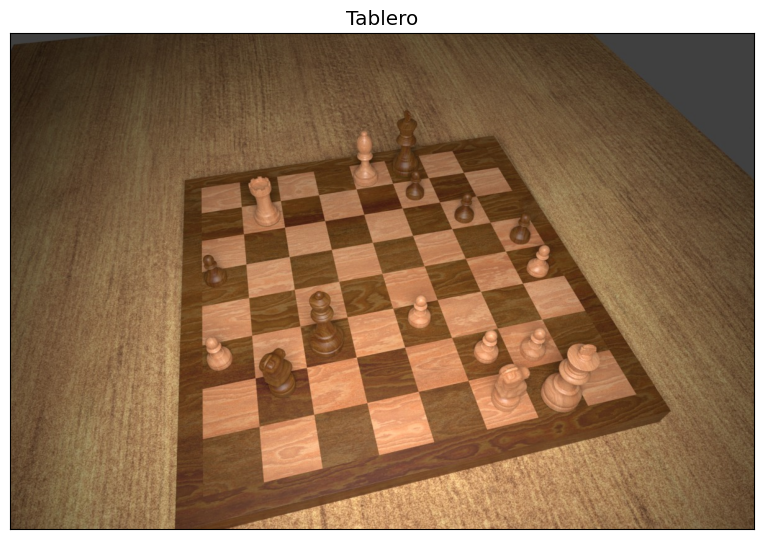

In [ ]:
img = readIm(path/'tablero.jpeg')
displayIm(img, 'Tablero', 1.5)

## 3.2 Detector de bordes Canny y transformada de Hough

La cuadrícula del tablero tiene $8 \times 8$ casillas , luego $9$ líneas horizontales y verticales. En un primer paso nos interesa detectar esas líneas y a partir de allí calcular las intersecciones.

Para eso empezamos redimensionando la imagen de entrada para que tenga $1200$ píxeles de ancho manteniendo la relación de aspecto. Luego convertimos la imagen RGB en escala de grises (más simple de analizar en algoritmos de detección de bordes) y aplicamos el **detector de bordes Canny**. Sin entrar en detalles, Canny consiste en:

1.   **Eliminación del ruido**: se aplica suavizado Gaussiano porque la detección de bordes detecta ruido como bordes.
2.   **Filtración**: filtramos con derivada de Gaussiana y calculamos gradiente (magnitud y orientación) en cada píxel.
3.   **Supresión de no máximos**: guardamos los píxeles que son máximos en un vecindario en dirección de la orientación del gradiente y suprimimos los demás, reduciendo los bordes a un píxel de ancho.
4.   **Histéresis**: definimos umbral inferior y superior, los píxeles en $[\mathrm{low}, ∞]$ forman parte de bordes fuertes y los dejamos, los píxeles en $[\mathrm{low}, \mathrm{upp}]$ se conservan si están conectados a bordes fuertes, si no se suprimen, y los píxeles en $[-∞, \mathrm{sup}]$ son bordes débiles que se eliminan.

Este primer paso nos preprocesa la imagen de entrada dejando solo los bordes que nos interesan y desechando información inútil para la detección de líneas rectas que queremos hacer.

Cabe resaltar que los parámetros óptimos usados en `cv2.Canny` (umbral inferior `threshold1=90` y superior `threshold2=400`) fueron encontrados por Wölflein usando grid search sobre un conjunto de parámetros razonables en un subconjunto pequeño del dataset. El valor del parámetro `apertureSize` controla el tamaño del kernel de Sobel que se usa por `cv2.Canny` para el cálculo de gradientes y es por defecto $3$.

https://docs.opencv.org/4.x/da/d22/tutorial_py_canny.html

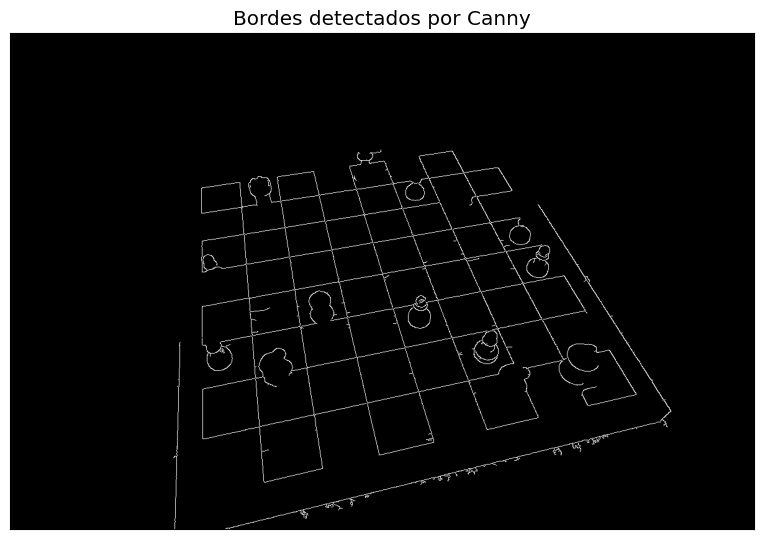

In [ ]:
# Redimensiono manteniendo aspect ratio
h, w, _ = img.shape
img_scale = 1200 / w
dims = (1200, int(h * img_scale))
img = cv2.resize(img, dims)
# Escala de grises
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# Canny con threshold1=90 y threshold2=400
edges = cv2.Canny(gray, 90, 400)
# Visualizo
displayIm(edges, 'Bordes detectados por Canny', 1.5)

Como podemos ver, Canny detecta bastante bien los bordes, aunque ya se ve que tenemos un problema: algunas rectas que nos interesan aparecen troceadas e incompletas. Es posible que en algún otro ejemplo de tablero incluso no aparezca alguna línea recta. Luego con esto queda claro que detectar todas las líneas no será siempre posible. Pero eso no importa ya que las rectas faltantes se pueden inferir a partir de las rectas que sí se han detectado. Más adelante veremos cómo se puede hacer eso.

En el siguiente paso, aplicamos **transformada de Hough** para detectar líneas rectas. Recordamos como funciona la transformada de Hough para líneas. Cada punto $(x_i, y_i)$ es tal que satisface $y_i=mx_i+c$ donde $(m,c)$ son los parámetros de la recta que pasa por ese punto. Luego ese punto en el espacio de la imagen tiene asociado una recta $c=-mx_i+y_i$ en el espacio paramétrico. Esta recta representa todas las rectas que pasan por el punto en el espacio de la imagen. Luego la transformada de Hough consiste en:


1.   Cuantizar el espacio paramétrico $(m,c)$
2.   Crear un vector acumulador $A(m,c)$ inicializado a $0$
3.   Para cada punto $(x_i, y_i)$, incrementar $A(m,c)$ si $(m,c)$ está en la recta $c=-mx_i+y_i$

Los máximos locales del acumulador representan las rectas encontradas. Esta forma de representar la recta tiene el problema de que la pendiente $m$ toma valores reales, de modo que hace falta un acumulador muy grande luego más memoria y capacidad de cómputo.

Por eso nosotros trabajamos con la forma normal de Hesse, es decir parametrizamos la recta como $\rho = x \cos \theta + y \sin \theta$ con $(\rho, \theta)$ parámetros que representan la distancia al origen y el ángulo del vector normal con el eje $X$ respectivamente. Para un punto $(x,y)$ la ecuación anterior representa la familia de rectas que pasan por el punto, mientras que en el espacio paramétrico tenemos una sinusoide correspondiente al punto. Luego ahora podemos parametrizar las rectas con $\rho \geq 0$ y $0 \leq \theta \leq 2 \pi$, de modo que se soluciona el problema del acumulador.

En la implementación, usaremos `cv2.HoughLines` que tiene como parámetros la imagen con los bordes, las resoluciones en el acumulador de los parámetros $(\rho, \theta)$ que en nuestro caso son `rho=1` y `theta=pi/360`, y finalmente el umbral `threshold=150` para el acumulador que determina qué rectas consideramos máximos locales.

Primero creamos una función para mantener la convención para la representación de la recta mencionada antes, es decir que $\rho \geq 0$. Esto nos facilitará el trabajo posterior. Si $\rho < 0$, simplemente tenemos $-\rho=x(-\cos \theta)+y(-\sin\theta)=x\cos(\pi-\theta)+y(-\sin(\pi-\theta))=x\cos(\theta-\pi)+y\sin(\theta-\pi)$

Luego basta con multiplicar por $-1$ a $\rho$ y restar $\pi$ a $\theta$.

In [ ]:
def _fix_negative_rho_in_hesse_normal_form(lines: np.ndarray) -> np.ndarray:
    # Copia
    lines = lines.copy()
    # Líneas con rho negativo
    neg_rho_mask = lines[..., 0] < 0
    # Multiplico rho por -1
    lines[neg_rho_mask, 0] = - \
        lines[neg_rho_mask, 0]
    # Resto pi a theta
    lines[neg_rho_mask, 1] =  \
        lines[neg_rho_mask, 1] - np.pi
    return lines

Ahora creamos la función para detectar las líneas rectas usando `cv2.HoughLines` tal y como hemos dicho. Arreglamos el $\rho$ de las líneas detectadas y definimos un umbral angular de $30$ grados para detectar líneas casi verticales ($\theta < 30º$) o casi horizontales ($\theta < \pi/2$). De esta forma nos libramos de rectas que seguro que no son las que buscamos, aunque todavía no hemos clasificado las rectas en horizontales y verticales, eso se hará después.

In [ ]:
def _detect_lines(edges: np.ndarray) -> np.ndarray:
    # Transformada de Hough
    lines = cv2.HoughLines(edges, 1, np.pi/360, threshold=150)
    # Solo queremos array de [rho, theta]
    lines = lines.squeeze(axis=-2)
    # Arreglamos rho negativo
    lines = _fix_negative_rho_in_hesse_normal_form(lines)
    # Umbral
    threshold = np.deg2rad(30)
    # Rectas casi verticales o casi horizontales
    vmask = np.abs(lines[:, 1]) < threshold
    hmask = np.abs(lines[:, 1] - np.pi / 2) < threshold
    # Nos quedamos solo con esas
    mask = vmask | hmask
    lines = lines[mask]
    return lines

Ahora veamos cuántas líneas se detectan en nuestro ejemplo.

In [ ]:
lines = _detect_lines(edges)
len(lines)

27

Tenemos $27$, pero estaría bien visualizarlas en la imagen. Vamos a definir una función que nos servirá para visualizar rectas dadas por $(\rho, \theta)$ en imágenes. Para eso usaremos `cv2.line`, que dibuja un segmento de una recta dados los dos puntos que definen el segmento y la imagen en la que se tiene que dibujar. También controlamos el color y el grosor del segmento.

Como queremos dibujar una recta, no un segmento, vamos a calcular las intersecciones de las rectas que queremos dibujar con la imagen para obtener los puntos del segmento que nos tiene que aparecer en la imagen. Para eso calculamos la diagonal de la imagen, que es la longitud máxima de un segmento en la imagen, y calculamos el punto de la recta más cercano al origen. A partir de ese extendemos dos vectores en direcciones de la recta con la longitud de la diagonal, obteniendo puntos fuera de la imagen que se pasan a `cv2.line` para visualizar la recta.

In [ ]:
def draw_lines(img: np.ndarray, lines: np.ndarray, color: tuple = (0, 0, 255), thickness: int = 2):
    """
    Draw lines specified in Hough space on top of the input image.

    Args:
        img (np.ndarray): the input image
        lines (np.ndarray): the lines of shape [N, 2] where the last dimension are the rho and theta values
        color (tuple, optional): the color to draw the lines in. Defaults to (0, 0, 255).
        thickness (int, optional): thickness of the lines. Defaults to 2.
    """
    length = np.sqrt(img.shape[0]**2 + img.shape[1]**2)
    for rho, theta in lines:
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a * rho
        y0 = b * rho
        x1 = int(x0 + length * (-b))
        y1 = int(y0 + length * (a))
        x2 = int(x0 - length * (-b))
        y2 = int(y0 - length * (a))
        cv2.line(img, (x1, y1), (x2, y2), color, thickness)

Ahora guardamos la image original y visualizamos las rectas obtenidas en la copia del original.

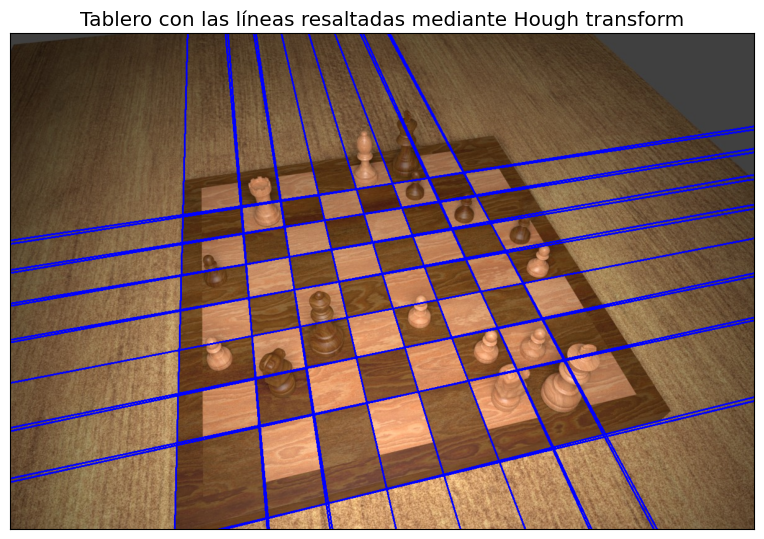

In [ ]:
img_lines = img.copy()
draw_lines(img_lines, lines)
displayIm(img_lines, 'Tablero con las líneas resaltadas mediante Hough transform', 1.5)

Como podemos ver, se detectan bastante bien las líneas, comparando con lo que nos ha proporcionado Canny parece que Hough detecta bastante bien las rectas que estén más o menos completas. Las troceadas, como las que tenemos en los extremos de la cuadrícula, no se detectan. De hecho incluso hemos detectado rectas que no nos interesan, como los bordes del propio tablero físico (la recta vertical izquierda y horizontal inferior). Tanto el primer problema como el segundo se resolverá en lo que sigue más adelante (involucra cálculo de homografías y estimación de en que dirección nos faltan rectas), por ahora no nos preocupamos por eso ya que estos problemas se tienen en cuenta y se pueden resolver usando las propiedades geométricas de la cuadrícula del tablero.

Hasta aquí, hemos obtenido un conjunto bastante grande de rectas que todavía no se han clasificado en horizontales ni verticales y además hemos detectado muchas rectas redundantes, luego nos queda la labor de filtrarlas y obtener las $9+9=18$ que nos interesan.

## 3.3 Clustering y eliminación de rectas con clustering aglomerativo y DBSCAN

Para identificar las esquinas del tablero deberemos distinguir cuáles, de las rectas identificadas, son verticales y cuáles horizontales.

Como hemos visto en apartados anteriores, por cada recta identificada obtenemos dos valores $(\rho, \theta)$, donde $\rho$ es la distancia del origen a la recta (que por lo realizado anteriormente será siempre positiva) y $\theta$ es el ángulo que forma la normal de la recta con el eje X.

La idea será agrupar las distintas rectas en función del ángulo más pequeño que forman las rectas entre ellas.

En primer lugar, definimos una función que calcula el ángulo más pequeño entre dos rectas, dados $\theta_1$ y $\theta_2$.

Los vectores directores de cada recta serán, respectivamente:
$$
d_1 = (-\sin(\theta_1),\cos(\theta_1)) \hspace{0.5cm} d_2 = (-\sin(\theta_2),\cos(\theta_2))  
$$

Aplicando las propiedades del producto escalar, obtenemos que el ángulo que forman $d_1$ y $d_2$ será:
$$
\theta = | \theta_1 - \theta_2|
$$

Para calcular el ángulo más pequeño que forman las dos rectas, deberemos devolver el ángulo que forman las rectas menor de 90 grados. Para ello, calcularemos el mínimo de la diferencia entre ángulos obtenida $\theta$ y $\pi - \theta$.

Nótese que si $\theta_1$ y $\theta_2$ se diferencian en $\pi$, la función debería devolver 0 grados, ya que la segunda recta sería equivalente a rotar 180 grados la primera recta (por lo que queda igual).

In [ ]:
def _absolute_angle_difference(x, y):

    # Calculamos la diferencia entre los dos ángulos (en módulo 2*PI)
    diff = np.mod(np.abs(x - y), 2*np.pi)

    # Nos quedamos con el mínimo entre esa diferencia y PI - diferencia
    return np.min(np.stack([diff, np.pi - diff], axis=-1), axis=-1)

Nuestro objetivo será ahora agrupar las distintas rectas usando el cálculo anterior. Para la agrupación, utilizaremos un algoritmo de Clústering Aglomerativo de abajo a arriba.

Se ha optado por utilizar Clústering Aglomerativo para establecer una estructura jerárquica que facilitara la creación de los clústers. Cada línea comenzará en su propio clúster y se irán uniendo clústers intentando minimizar la varianza intra-clúster. Como ya hemos comentado, la métrica que usaremos como distancia será la diferencia entre ángulos que hemos calculado entre cada par de rectas.

En primer lugar, para facilitar el proceso de agrupamiento, ordenaremos las distintas líneas en función de la distancia al origen ($\rho$). Esto permitirá optimizar la convergencia y evitar puntos de inicio aleatorios:

In [ ]:
def _sort_lines(lines: np.ndarray) -> np.ndarray:
    if lines.ndim == 0 or lines.shape[-2] == 0:
        return lines
    rhos = lines[..., 0]
    sorted_indices = np.argsort(rhos)
    return lines[sorted_indices]

Pasamos ya a aplicar el clústering aglomerativo con un número de clústers igual a 2 (horizontales y verticales). Para ello, calculamos una matriz de distancias dada por la diferencia entre ángulos de cada par de rectas, y ajustamos el modelo con dicha matriz.

Para ir ajustando los clústers, se utilizará el promedio de las distancias entre todos los puntos de los clusters. Se ha seguido este procedimiento, en lugar de usar únicamente la distancia máxima o mínima, para tener la mayoría de puntos de cada clúster en cuenta.

Una vez tenemos los clústers calculamos, utilizando la función anteriormente implementada, el ángulo de las líneas de cada clúster con el eje Y (recta con $\theta = 0$). El clúster con un ángulo mayor respecto al eje Y será el clúster de las líneas horizontales.

In [ ]:
def _cluster_lines(lines: np.ndarray):
    lines = _sort_lines(lines)
    thetas = lines[..., 1].reshape(-1, 1)

    # Cálculo matriz distancia
    distance_matrix = pairwise_distances(
        thetas, thetas, metric=_absolute_angle_difference)

    # Clústering Aglomerativo
    # Average = Usa el promedio de las distancias entre todos los puntos de los clusters.
    agg = AgglomerativeClustering(n_clusters=2, metric="precomputed", linkage="average")
    clusters = agg.fit_predict(distance_matrix)

    # Determinamos cuál de los dos clústers es horizontal y cuál vertical
    angle_with_y_axis = _absolute_angle_difference(thetas, 0.)
    if angle_with_y_axis[clusters == 0].mean() > angle_with_y_axis[clusters == 1].mean():
        hcluster, vcluster = 0, 1
    else:
        hcluster, vcluster = 1, 0

    horizontal_lines = lines[clusters == hcluster]
    vertical_lines = lines[clusters == vcluster]

    return horizontal_lines, vertical_lines

Veamos un ejemplo de una ejecución de este agrupamiento:

In [ ]:
all_horizontal_lines, all_vertical_lines = _cluster_lines(lines)

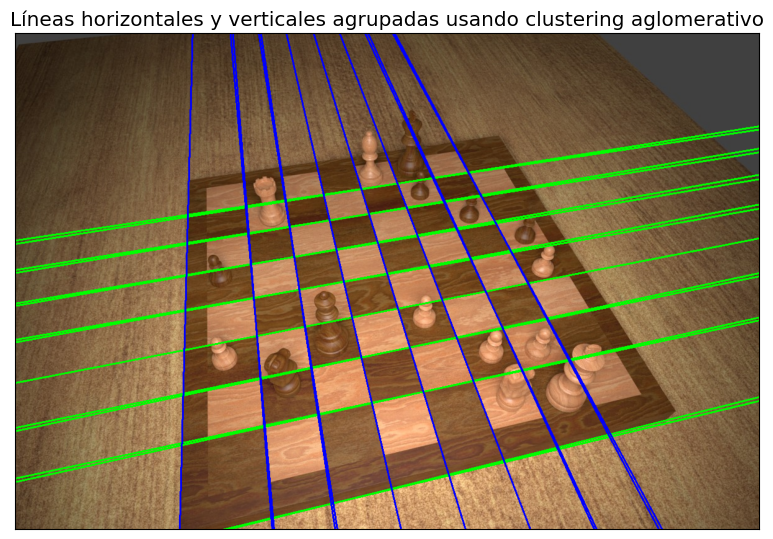

In [ ]:
img_lines = img.copy()

# Pintamos en verde las líneas horizontales
draw_lines(img_lines, all_horizontal_lines, (0,255,0))

# Pintamos de azul las líneas verticales
draw_lines(img_lines, all_vertical_lines, (0,0,255))

displayIm(img_lines, 'Líneas horizontales y verticales agrupadas usando clustering aglomerativo', 1.5)

Vemos que ya nuestro algoritmo distingue perfectamente entre las líneas horizontales (pintadas en verde) y las líneas verticales detectadas (pintadas de azul).

Sin embargo, podemos comprobar, especialmente en los extremos de la imagen, que existen muchas líneas, tanto verticales como horizontales, que han sido detectadas como líneas distintas, pero que son muy similares.

Por cada grupo de líneas similares, deberíamos eliminarlas todas, y quedarnos únicamente con una de ellas (un representante de cada grupo). Para ello, aplicaremos de nuevo un algoritmo de clústering, aunque en este caso será DBSCAN.

En primer lugar, para eliminar las líneas horizontales similares, determinaremos la línea vertical media del clúster vertical $(\rho_{avg}, \theta_{avg})$. Calcularemos entonces los puntos de intersección del clúster horizontal con esta recta.

Es lógico pensar que líneas horizontales similares tendrán puntos de intersección con esta recta muy cercanos, por lo que tiene sentido utilizar un algoritmo de clústering que agrupe los puntos de intersección.

Para eliminar líneas verticales similares se realizará el mismo proceso, pero usando la línea horizontal media del clúster horizontal y calculando los puntos de intersección con el clúster vertical.

No sabemos con exactitud ni el número de clústers ni la forma de los clústers, y todos los clústers están bien separados por regiones de baja densidad (en las zonas de intersecciones hay muchos puntos alejados de la siguiente zona de intersección), por lo que es un caso perfecto para aplicar DBSCAN.

Creamos primero una función que calcule los puntos de intersección de dos rectas $(\rho_1, \theta_1)$ y $(\rho_2, \theta_2)$.

Como las ecuaciones de las rectas son:
$$
\left\{
\begin{array}{l}
\rho_1 = x\cos(\theta_1) + y\sin(\theta_1) \\
\rho_2 = x\cos(\theta_2) + y\sin(\theta_2) \\
\end{array}
\right.
$$

tenemos dos ecuaciones con dos incógnitas ($x$ e $y$), y despejando obtenemos que los puntos de intersección son:

$$
y = \frac{\rho_2 \cos(\theta_1) - \rho_1 \cos(\theta_2) }{\sin(\theta_2)\cos(\theta_1) - \sin(\theta_1)\cos(\theta_2)}
, \hspace{0.3cm}
x = \frac{\rho_2 \sin(\theta_1) - \rho_1 \sin(\theta_2) }{\cos(\theta_2)\sin(\theta_1) - \cos(\theta_1)\sin(\theta_2)}
$$

Por tanto:

In [ ]:
def get_intersection_point(rho1: np.ndarray, theta1: np.ndarray, rho2: np.ndarray, theta2: np.ndarray) -> typing.Tuple[np.ndarray, np.ndarray]:
    """Obtain the intersection point of two lines in Hough space.

    This method can be batched

    Args:
        rho1 (np.ndarray): first line's rho
        theta1 (np.ndarray): first line's theta
        rho2 (np.ndarray): second lines's rho
        theta2 (np.ndarray): second line's theta

    Returns:
        typing.Tuple[np.ndarray, np.ndarray]: the x and y coordinates of the intersection point(s)
    """
    # rho1 = x cos(theta1) + y sin(theta1)
    # rho2 = x cos(theta2) + y sin(theta2)
    cos_t1 = np.cos(theta1)
    cos_t2 = np.cos(theta2)
    sin_t1 = np.sin(theta1)
    sin_t2 = np.sin(theta2)
    x = (sin_t1 * rho2 - sin_t2 * rho1) / (cos_t2 * sin_t1 - cos_t1 * sin_t2)
    y = (cos_t1 * rho2 - cos_t2 * rho1) / (sin_t2 * cos_t1 - sin_t1 * cos_t2)
    return x, y

Pasamos a eliminar las líneas similares.

El algoritmo DBSCAN requiere dos parámetros: `eps`, que es la distancia máxima que puede existir entre dos muestras para ser consideradas vecinos y `min_samples`, que es el número de puntos en el vecindario de un punto para que sea considerado punto central. Todos los puntos que son alcanzables entre ellos (en un radio `eps`) formarán parte del mismo clúster.

En este momento no queremos tratar outliers, por lo que tiene sentido considerar que todos los puntos forman parte de algún clúster (`min_samples = 1`). En cuanto a `eps`, el paper original del creador del dataset (Wolflein) recomienda utilizar `eps=12`, valor determinado empíricamente, ya que proporciona muy buenos resultados, por lo que será el valor que utilizaremos.

Una vez tenemos los clústers, elegiremos una línea representante de cada clúster. En concreto, nos quedaremos con la mediana (ordenando las rectas según $\rho$):

In [ ]:
def _eliminate_similar_lines(lines: np.ndarray, perpendicular_lines: np.ndarray) -> np.ndarray:
    perp_rho, perp_theta = perpendicular_lines.mean(axis=0)
    rho, theta = np.moveaxis(lines, -1, 0)
    intersection_points = get_intersection_point(
        rho, theta, perp_rho, perp_theta)
    intersection_points = np.stack(intersection_points, axis=-1)

    clustering = DBSCAN(eps=12, min_samples=1).fit(intersection_points)

    filtered_lines = []
    for c in range(clustering.labels_.max() + 1):
        lines_in_cluster = lines[clustering.labels_ == c]
        rho = lines_in_cluster[..., 0]
        median = np.argsort(rho)[len(rho)//2]
        filtered_lines.append(lines_in_cluster[median])
    return np.stack(filtered_lines)

Veamos ahora un ejemplo de una ejecución de lo anterior:

In [ ]:
horizontal_lines = _eliminate_similar_lines(all_horizontal_lines, all_vertical_lines)
vertical_lines = _eliminate_similar_lines(all_vertical_lines, all_horizontal_lines)

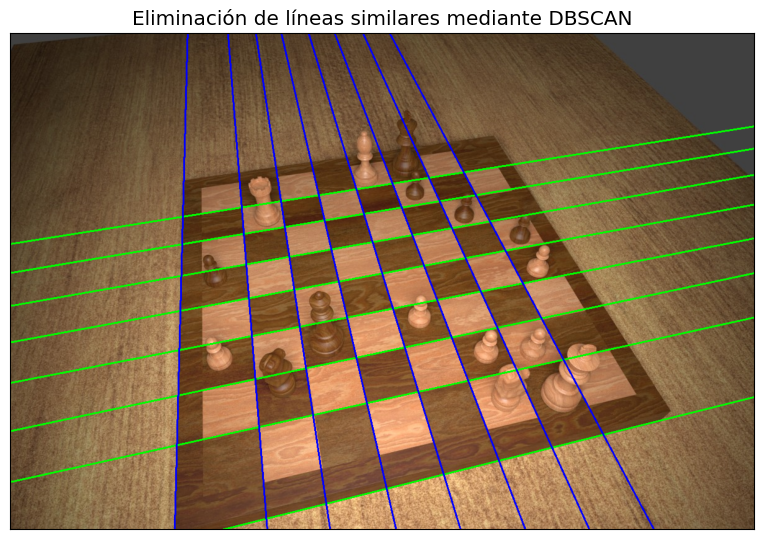

In [ ]:
img_lines = img.copy()
draw_lines(img_lines, horizontal_lines, (0,255,0))
draw_lines(img_lines, vertical_lines, (0,0,255))
displayIm(img_lines, 'Eliminación de líneas similares mediante DBSCAN', 1.5)

Vemos que ahora las líneas identificadas, tanto verticales como horizontales, son ya muy distintas entre sí, por lo que obtenemos el resultado que esperábamos.

Para facilitar los siguientes pasos, creamos una función que permita calcular rápidamente los puntos de intersección entre dos conjuntos de rectas:

In [ ]:
def _get_intersection_points(horizontal_lines: np.ndarray, vertical_lines: np.ndarray) -> np.ndarray:

    # Coordenadas de las rectas horizontales (rho1, theta1) y de las verticales (rho2, theta2)
    rho1, theta1 = np.moveaxis(horizontal_lines, -1, 0)
    rho2, theta2 = np.moveaxis(vertical_lines, -1, 0)

    # Todas las combinaciones de las rectas verticales y horizontales
    rho1, rho2 = np.meshgrid(rho1, rho2, indexing="ij")
    theta1, theta2 = np.meshgrid(theta1, theta2, indexing="ij")

    # Llamamos a la función que calcula los puntos de intersección
    intersection_points = get_intersection_point(rho1, theta1, rho2, theta2)
    intersection_points = np.stack(intersection_points, axis=-1)
    return intersection_points

Para mostrar gráficamente los puntos de intersección, creamos una función que permita dibujar puntos en la imagen:

In [ ]:
all_intersection_points = _get_intersection_points(horizontal_lines, vertical_lines)

In [ ]:
def draw_points(img: np.ndarray, points: np.ndarray, color: tuple = (255, 0, 0), radius: int = 10, thickness: int = -1):
    """Draw points on top of the input image.

    Args:
        img (np.ndarray): The input image.
        points (np.ndarray): A matrix of shape [H, W, 2] where each [i, j] element represents (x, y) coordinates.
        color (tuple, optional): The color to draw the points in. Defaults to (0, 0, 255).
        radius (int, optional): The radius of the points. Defaults to 3.
        thickness (int, optional): Thickness of the points. Defaults to -1 (filled circle).
    """
    # Flatten the matrix to a 2D array of shape [N, 2]
    flattened_points = points.reshape(-1, 2)

    # Draw each point
    for x, y in flattened_points:
        cv2.circle(img, (int(x), int(y)), radius, color, thickness)

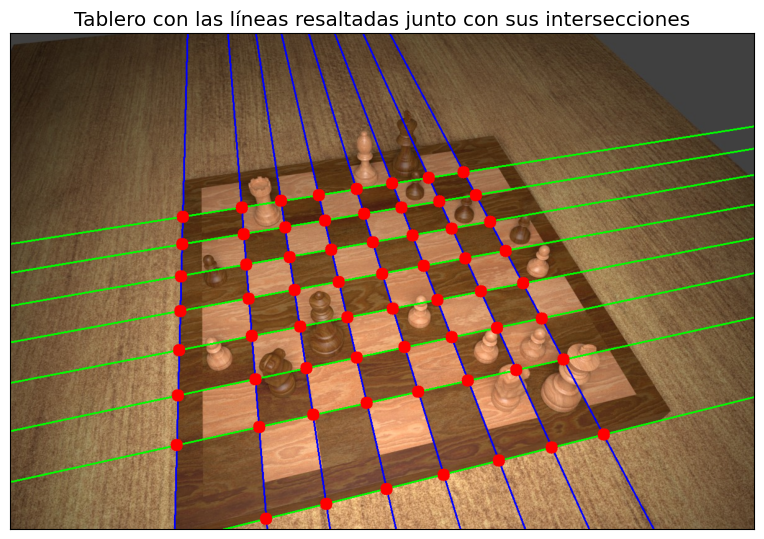

In [ ]:
img_lines_points = img_lines.copy()
draw_points(img_lines_points, all_intersection_points)
displayIm(img_lines_points, 'Tablero con las líneas resaltadas junto con sus intersecciones', 1.5)

y comprobamos que los puntos de intersección son exactamente los que esperábamos, todos los puntos en los que se cruzan las rectas verticales y horizontales que hemos detectado, por lo que podemos concluir que el  modelo parece funcionar correctamente hasta este punto.

## 3.4 Cálculo de homografía con algoritmo basado en RANSAC

Como podemos observar en la imagen anterior, no se han calculado las 9 líneas horizontales y verticales que delimitan las casillas del tablero, sino que disponemos únicamente de 8 líneas verticales y horizontales, es decir, falta una línea horizontal y otra línea vertical, las correspondientes a dos de los lados extremos del tablero. Es habitual que se dé este patrón una vez hemos finalizado las etapas anteriores, por tanto se ha de determinar si las líneas adicionales que faltan deberían de estar encima o debajo de las horizontales que ya tenemos, y en el caso de las verticales, a la derecha o a la izquierda.

Otro problema que tenemos es que hemos detectado líneas que pertenecen a los bordes del tablero físico pero no de la cuadrícula de juego, luego habrá que eliminar estas líneas y las intersecciones que generan.

Para resolver el problema de líneas faltantes, **es más sencillo transformar la imagen de entrada para que los puntos de intersección formen una malla**, es decir, tal y como se vería la imagen si observamos el tablero desde arriba. Con esta representación del tablero, se puede detectar más fácil en qué dirección expandir el tablero para encontrar las rectas faltantes. Además, esto es necesario en las fases posteriores del sistema, donde se han de recortar las casillas del tablero para suministrarlas a los clasificadores.

A partir de ahora, vamos a diferenciar entre el **tablero físico**, que es el tablero entero, la **cuadrícula** del tablero en la imagen original, que contiene las $64$ casillas, y la malla, que es una rejilla $8 \times 8$ con rectas que forman ángulos rectos y casillas de dimensión $1 \times 1$.



La transformación proyectiva que buscamos viene dada por la correspondiente **matriz de homografía H**.

Para encontrar esta matriz utilizamos un algoritmo basado en **RANSAC**. Este algoritmo es robusto incluso cuando faltan líneas o cuando se detectan líneas adicionales a partir de bordes rectos en otras partes de la imagen.  

El algoritmo se describirá a continuación:

1. Se muestrean de forma aleatoria cuatro puntos de intersección que se encuentran en dos líneas verticales y dos horizontales diferentes, que forman un rectángulo.

2. Calculamos la homografía que proyecta esos cuatro puntos en un rectangulo de anchura y altura unidad.

3. Proyectamos el resto de puntos de intersección y calculamos el número de inliers, es decir, el número de puntos que quedan explicados por el modelo que constituye la homografía.

4. Si el número de inliers es mayor que el de iteraciones anteriores, guardamos como mejor homografía y mejor conjunto de inliers los de esta iteración.

5. Repetimos desde el paso 1 para otras dimensiones del rectángulo (tomarían valores entre 2 y 8). Así determinamos cuantas casillas del tablero encajan en el rectángulo.

6. Repetimos desde el paso 1 hasta que la mitad de los puntos de intersección sean inliers.

7. Volvemos a calcular el error (error mínimo cuadrático) de la solución obtenida usando todos los inliers.

A continuación, transformamos la imagen de entrada y los puntos de intersección inliers según la de homografía calculada. Los puntos de intersección se calculan de manera que sus coordenadas sean números enteros, ya que cada cuadrado de la cuadrícula del tablero de ajedrez transformado tiene lado unidad en la malla.

De esta forma, RANSAC no solo nos calcula la mejor homografía que necesitamos para resolver el problema de rectas faltantes, sino que ademas nos ayuda a resolver el segundo problema que mencionamos antes, el de líneas detectadas que no pertenecen a la cuadrícula, ya que nos calcula los inliers explicados por la mejor homografía, permitiéndonos eliminar a los outliers, que son puntos generados por las rectas que no nos interesan.





Para poder llevar a cabo la transformación proyectiva definimos varias funciones con el objetivo de modularizar el procedimiento.

Mediante las funciones `compute_transformation_matrix` y `_compute_homography` calculamos la matriz de homografía a partir de cuatro de los puntos de intersección de la imagen original, tal y como habíamos explicado anteriormente.

In [ ]:
def compute_transformation_matrix(src_points: np.ndarray, dst_points: np.ndarray) -> np.ndarray:
    """Compute the transformation matrix based on source and destination points.

    Args:
        src_points (np.ndarray): the source points (shape: [..., 2])
        dst_points (np.ndarray): the source points (shape: [..., 2])

    Returns:
        np.ndarray: the transformation matrix
    """
    transformation_matrix, _ = cv2.findHomography(src_points.reshape(-1, 2),
                                                  dst_points.reshape(-1, 2))
    return transformation_matrix

In [ ]:
def _compute_homography(intersection_points: np.ndarray, row1: int, row2: int, col1: int, col2: int):

    # Obtenemos los puntos de intersección
    p1 = intersection_points[row1, col1]  # top left
    p2 = intersection_points[row1, col2]  # top right
    p3 = intersection_points[row2, col2]  # bottom right
    p4 = intersection_points[row2, col1]  # bottom left

    # Declaramos  listas, una con los puntos y otra con sus coordenadas que se
    # esperan después de aplicar la transformación proyectiva
    src_points = np.stack([p1, p2, p3, p4])
    dst_points = np.array([[0, 0],  # top left
                           [1, 0],  # top right
                           [1, 1],  # bottom right
                           [0, 1]])  # bottom left

    # Calculamos y devolvemos la homografía correspondiente
    return compute_transformation_matrix(src_points, dst_points)

La función `to_homogenous_coordinates` se encarga de realizar el cambio de coordenadas cartesianas a homogéneas, y en `from_homogenous_coordinates` se realiza el cambio inverso.

Esto es necesario para poder poder operar con la homografía, y posteriormente para recuperar los valores dentro de la malla en coordenadas cartesianas.

In [ ]:
def to_homogenous_coordinates(coordinates: np.ndarray) -> np.ndarray:
    """Convert Cartesian to homogenous coordinates.

    Args:
        coordinates (np.ndarray): the Cartesian coordinates (shape: [..., 2])

    Returns:
        np.ndarray: the homogenous coordinates (shape: [..., 3])
    """
    return np.concatenate([coordinates,
                           np.ones((*coordinates.shape[:-1], 1))], axis=-1)

In [ ]:
def from_homogenous_coordinates(coordinates: np.ndarray) -> np.ndarray:
    """Convert homogenous to Cartesian coordinates.

    Args:
        coordinates (np.ndarray): the homogenous coordinates (shape: [..., 3])

    Returns:
        np.ndarray: the Cartesian coordinates (shape: [..., 2])
    """
    return coordinates[..., :2] / coordinates[..., 2, np.newaxis]

En `_warp_points` calculamos las coordenadas cartesianas en la malla de los puntos del tablero transformados mediante la homografía.

In [ ]:
def _warp_points(transformation_matrix: np.ndarray, points: np.ndarray) -> np.ndarray:

    # Pasamos los puntos de coordenadas cartesianas a homogéneas
    points = to_homogenous_coordinates(points)

    # Aplicamos la transformación proyectiva mediante la homografía
    warped_points = points @ transformation_matrix.T

    # Devolvemos las coordenadas cartesianas de los puntos transformados
    return from_homogenous_coordinates(warped_points)

La función `_find_best_scale` identifica los mejores factores de proporcionalidad correspondientes a las dimensiones del rectángulo comentado anteriormente. Mediante su aplicación, además de obtener los factores anteriores, nos devuelve aquellos valores que se hayan identificado como inliers mediante una máscara booleana.

In [ ]:
def _find_best_scale(values: np.ndarray, scales: np.ndarray = np.arange(1, 9)):

    # Ordenamos las escalas que se van a utilizar
    scales = np.sort(scales)

    # Escalamos cada valor según cada factor de proporcionalidad
    scaled_values = np.expand_dims(values, axis=-1) * scales

    # Calculamos la distancia entre los valores con coordenadas enteras más cercanos
    diff = np.abs(np.rint(scaled_values) - scaled_values)

    # Un punto será inlier si la diferencia es menor que el umbral establecido
    inlier_mask = diff < 0.1 / scales

    # Contamos el número de inliers para cada escala
    num_inliers = np.sum(inlier_mask, axis=tuple(range(inlier_mask.ndim - 1)))

    # Encontramos el factor de escala con el mayor número de inliers
    best_num_inliers = np.max(num_inliers)

    # Escogemos la mejor escala, permitiendo una con menos inliers si la escala es pequeña
    index = np.argmax(num_inliers > 0.85 * best_num_inliers)

    return scales[index], inlier_mask[..., index]

La función `_discard_outliers` usa la función anterior para llevar a cabo el proceso de refinamiento de los puntos transformados por la homografía, descartando ouliers y ajustando los datos al mejor modelo posible. Además, calcula los mejores factores horizontal y vertical de la malla.

In [ ]:
def _discard_outliers(warped_points: np.ndarray, intersection_points: np.ndarray) -> typing.Tuple[np.ndarray, np.ndarray, float, float]:

    # Encontramos las mejores escalas horizontales y verticales para alinear los puntos deformados
    horizontal_scale, horizontal_mask = _find_best_scale(warped_points[..., 0])
    vertical_scale, vertical_mask = _find_best_scale(warped_points[..., 1])

    # Combinamos las máscaras horizontales y verticales para determinar todos los inliers
    mask = horizontal_mask & vertical_mask

    # Mantemos las filas y las columnas con más de un 50% de inliers
    num_rows_to_consider = np.any(mask, axis=-1).sum()
    num_cols_to_consider = np.any(mask, axis=-2).sum()
    rows_to_keep = mask.sum(axis=-1) / num_rows_to_consider > 0.7
    cols_to_keep = mask.sum(axis=-2) / num_cols_to_consider > 0.7

    # Filtramos los puntos deformados y los puntos de intersección utilizando las máscaras de los inliers
    warped_points = warped_points[rows_to_keep][:, cols_to_keep]
    intersection_points = intersection_points[rows_to_keep][:, cols_to_keep]

    return warped_points, intersection_points, horizontal_scale, vertical_scale

El siguiente paso que vamos a seguir es cuantizar los puntos que se encuentran en la malla generada tras aplicar la homogafía al tablero para que se vea a vista de pájaro. Para ello hacemos uso de la función `_quantize_points` que recibe los puntos de la malla generada y los puntos de intersección que hemos encontrado previamente de las líneas del tablero.

Dentro de la función lo que hacemos es calcular las medias de las distintas filas y columnas de los puntos de la malla, y eliminar los puntos que estén repetidos. Posteriormente calcula los límites de la malla transformada y nos aseguramos de que el número total de líneas sea menor que 9 para que todo se haga correctamente respetando las dimensiones de los tableros de ajedrez. Luego de eso eliminamos las filas y columnas que queden fuera del rango que hemos calculado previamente y calculamos los puntos que se encuentran entre las filas y columnas que haya sobrevivido al paso anterior.

Una vez que ya contamos con los puntos, lo que hacemos es traducirlos y escalarlos dentro de la red y calculamos el tamaño de la imagen total creada finalmente.

In [ ]:
def _quantize_points(warped_scaled_points: np.ndarray, intersection_points: np.ndarray) -> typing.Tuple[tuple, np.ndarray, np.ndarray, np.ndarray, np.ndarray]:
    mean_col_xs = warped_scaled_points[..., 0].mean(axis=0)
    mean_row_ys = warped_scaled_points[..., 1].mean(axis=1)

    col_xs = np.rint(mean_col_xs).astype(np.int32)
    row_ys = np.rint(mean_row_ys).astype(np.int32)

    # Remove duplicates
    col_xs, col_indices = np.unique(col_xs, return_index=True)
    row_ys, row_indices = np.unique(row_ys, return_index=True)
    intersection_points = intersection_points[row_indices][:, col_indices]

    # Compute mins and maxs in warped space
    xmin = col_xs.min()
    xmax = col_xs.max()
    ymin = row_ys.min()
    ymax = row_ys.max()

    # Ensure we a have a maximum of 9 rows/cols
    while xmax - xmin > 8:
        xmax -= 1
        xmin += 1
    while ymax - ymin > 8:
        ymax -= 1
        ymin += 1
    col_mask = (col_xs >= xmin) & (col_xs <= xmax)
    row_mask = (row_ys >= xmin) & (row_ys <= xmax)

    # Discard
    col_xs = col_xs[col_mask]
    row_ys = row_ys[row_mask]
    intersection_points = intersection_points[row_mask][:, col_mask]

    # Create quantized points array
    quantized_points = np.stack(np.meshgrid(col_xs, row_ys), axis=-1)

    # Transform in warped space
    translation = -np.array([xmin, ymin]) + 5
    scale = np.array([50, 50])

    scaled_quantized_points = (quantized_points + translation) * scale
    xmin, ymin = np.array((xmin, ymin)) + translation
    xmax, ymax = np.array((xmax, ymax)) + translation
    warped_img_size = (np.array((xmax, ymax)) + 5) * scale

    return (xmin, xmax, ymin, ymax), scale, scaled_quantized_points, intersection_points, warped_img_size

También creamos una función que calcula un número de valores entre 0 y una cota superior que se le indica como parámetro en la llamada.

In [ ]:
def _choose_from_range(upper_bound: int, n: int = 2):
    """Select and return a sorted array of n unique integers from [0, upper_bound).

    Args:
        upper_bound (int): Upper limit (exclusive).
        n (int, optional): Number of integers to select (default is 2).

    Returns:
        np.ndarray: Sorted array of selected integers.
    """
    return np.sort(np.random.choice(np.arange(upper_bound), (n,), replace=False), axis=-1)

### Ejemplo 1

Más adelante vamos a hacer uso de un bucle en el que utilizamos la técnica de RANSAC. Sin embargo, consideramos necesario hacer un ejemplo del proceso en el estado actual previo a la implementación del bucle con RANSAC con el fin de comprobar que es necesario hacerlo porque sino obtendremos datos erróneos.

El proceso que vamos a seguir va a ser simplemente la elección de unas filas y columnas al azar de las que vamos a obtener los 4 puntos de los que vamos a hacer uso para la creación de la homografía. Lo que esperamos es que obtengamos unos puntos erróneos que provoquen el colapso total de la homografía.

In [ ]:
best_num_inliers = 0
best_configuration = None
iterations = 0

np.random.seed(5)

row1, row2 = _choose_from_range(len(horizontal_lines))
col1, col2 = _choose_from_range(len(vertical_lines))
transformation_matrix = _compute_homography(all_intersection_points, row1, row2, col1, col2)
warped_points = _warp_points(transformation_matrix, all_intersection_points)
warped_points, intersection_points, horizontal_scale, vertical_scale = _discard_outliers(warped_points, all_intersection_points)

Obtenemos los puntos de las filas y columnas al hacer y vamos a ver que obtenemos puntos que no sean buenos para realizar la homografía.

In [ ]:
p1 = all_intersection_points[row1, col1]  # top left
p2 = all_intersection_points[row1, col2]  # top right
p3 = all_intersection_points[row2, col2]  # bottom right
p4 = all_intersection_points[row2, col1]  # bottom left

pts = np.array([p1, p2, p3, p4])

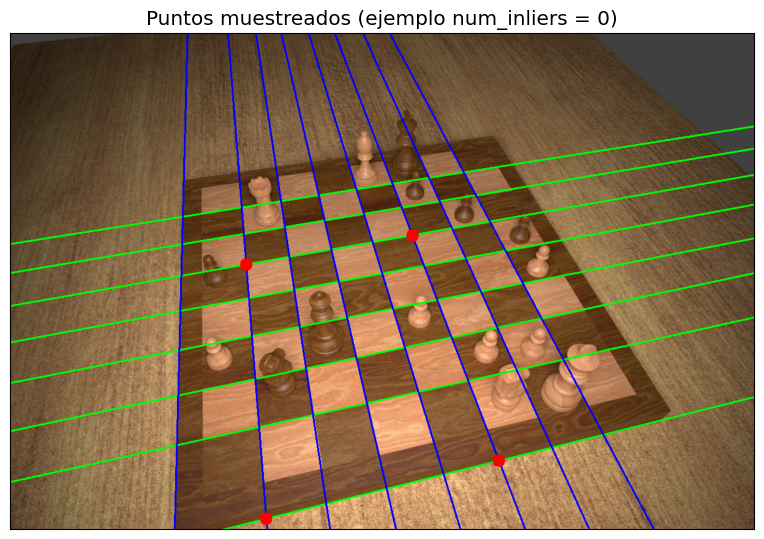

In [ ]:
img_lines_points = img_lines.copy()
draw_points(img_lines_points, pts)
displayIm(img_lines_points, 'Puntos muestreados (ejemplo num_inliers = 0)', 1.5)

Como podemos ver, se ha cumplido nuestros pronósticos y se han elegido 2 puntos en la línea que se reconoce como borde del tablero pero que en verdad ya queda fuera de lo que es el tablero de juego como tal. Por lo tanto, esta elección de puntos es una equivocada que nos llevaría a un proceso completamente mal hecho basado en una homografía que no tiene sentido desde el principio al usar 2 puntos que no se encuentran ni en el tablero.

In [ ]:
print(horizontal_scale)
print(vertical_scale)

4
1


Podemos ver que las escalas no tienen sentido tampoco.

Vamos a ver los puntos de intersección que se han obtenido y usado en la obtención de todo.

In [ ]:
print(intersection_points)

[]


Podemos ver que ni siquiera se han reconocido puntos de intersección lo que confirma una vez más la amplia necesidad de realizar el bucle junto al algoritmo de RANSAC.

### Ejemplo 2

Dentro del bucle de RANSAC en primer lugar es conveniente explicar que vamos a hacer un máximo de 200 iteraciones y hemos decicidido frenar el proceso si encontramos más de 30 inliers (estos parámetros han sido elegidos por Wölflein nuevamente y comprobamos posteriormente que funcionan a la perfección como será posible ver).

Dentro del bucle lo que hacemos es elegir 4 puntos al azar y los usamos para crear las homografías, calculamos los puntos de intersección en la cuadrícula ya transformada y eliminamos los outliers que no nos interesan al salirse del tablero. En caso de que hayamos obtenido más puntos dentro del tablero, actualizamos los puntos multiplicando por un vector con las escalas y eliminamos los duplicados. Tras esto, si el número de inliers sigue mejorando al máximo número de inliers hasta la iteración en la que se encuentra, entonces actualizamos todos los valores que van a marcar la mejor configuración.

De esta forma, como el bucle va comprobando y actualizando en cada iteración, nos quedaremos con el cuarteto de puntos que mejor resultado hayan obtenido.

In [ ]:
best_num_inliers = 0
best_configuration = None
iterations = 0
while iterations < 200 or best_num_inliers < 30:
    row1, row2 = _choose_from_range(len(horizontal_lines))
    col1, col2 = _choose_from_range(len(vertical_lines))
    transformation_matrix = _compute_homography(all_intersection_points,
                                                row1, row2, col1, col2)
    warped_points = _warp_points(
        transformation_matrix, all_intersection_points)
    warped_points, intersection_points, horizontal_scale, vertical_scale = _discard_outliers(warped_points, all_intersection_points)
    num_inliers = np.prod(warped_points.shape[:-1])

    if num_inliers > best_num_inliers:
        warped_points *= np.array((horizontal_scale, vertical_scale))

        # Quantize and reject deuplicates
        (xmin, xmax, ymin, ymax), scale, quantized_points, intersection_points, warped_img_size = configuration = _quantize_points(warped_points, intersection_points)

        # Calculate remaining number of inliers
        num_inliers = np.prod(quantized_points.shape[:-1])

        if num_inliers > best_num_inliers:
            best_num_inliers = num_inliers
            best_configuration = configuration
            best_row1 = row1
            best_row2 = row2
            best_col1 = col1
            best_col2 = col2
            best_horizontal_scale = horizontal_scale
            best_vertical_scale = vertical_scale

    iterations += 1

In [ ]:
p1 = all_intersection_points[best_row1, best_col1]  # top left
p2 = all_intersection_points[best_row1, best_col2]  # top right
p3 = all_intersection_points[best_row2, best_col2]  # bottom right
p4 = all_intersection_points[best_row2, best_col1]  # bottom left

pts = np.array([p1, p2, p3, p4])

Vamos a imprimir los puntos que ha encontrado el bucle haciendo uso de RANSAC.

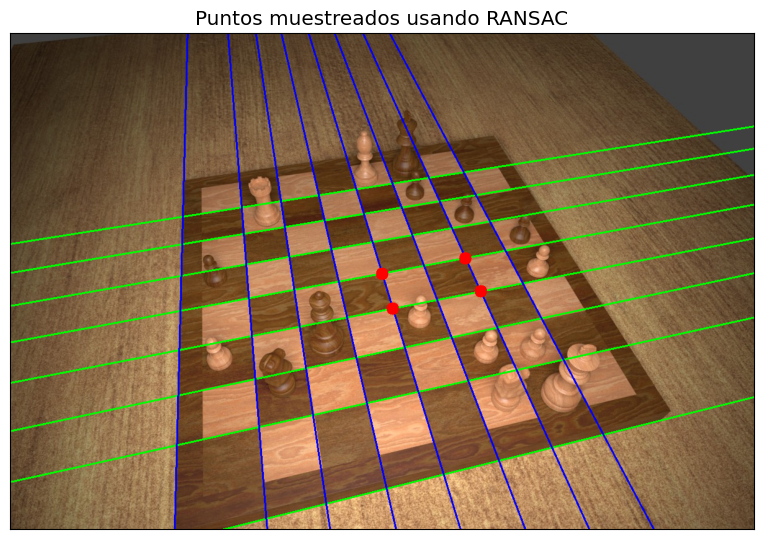

In [ ]:
img_lines_points = img_lines.copy()
draw_points(img_lines_points, pts)
displayIm(img_lines_points, 'Puntos muestreados usando RANSAC', 1.5)

Podemos ver que se eligen 4 puntos perfectos que se encuentran en el interior de la cuadrícula por lo que esta vez la transformación mediante la homografía sí que va a ser correcta. También comprobamos abajo que la escala en este caso sí que cuadra con lo que se visualiza.

In [ ]:
print(best_horizontal_scale)
print(best_vertical_scale)

2
1


In [ ]:
print(best_num_inliers)

49


Viendo el número de inliers, de forma intuitiva podemos suponer que se detectan la mayoría (si no todos) los puntos de intersección entre las líneas del tablero que detectamos bien ( y que posteriormente van a ser corregidas).

In [ ]:
# Retrieve best configuration
(xmin, xmax, ymin, ymax), scale, quantized_points, intersection_points, warped_img_size = best_configuration

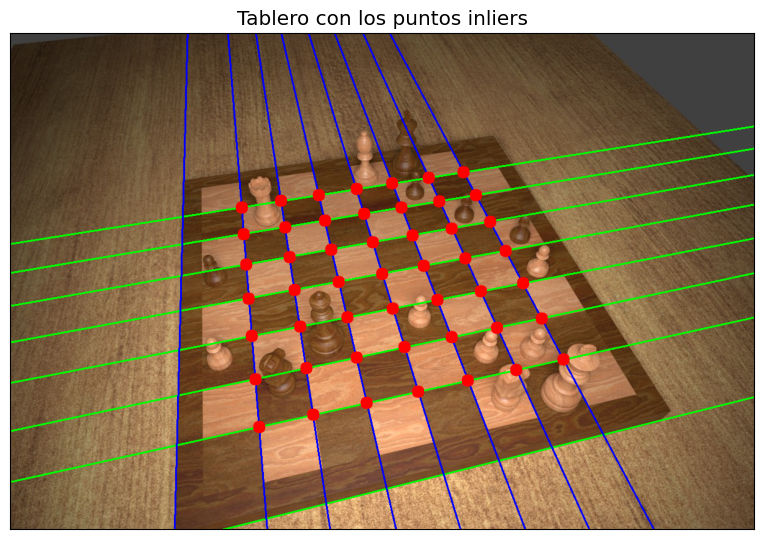

In [ ]:
img_lines_points = img_lines.copy()
draw_points(img_lines_points, intersection_points)
displayIm(img_lines_points, 'Tablero con los puntos inliers', 1.5)

Observamos que el resultado obtenido es imposible de mejorar a lo que podríamos esperar ya que obtiene a la perfección todos y cada uno de los puntos que se pueden detectar por ahora.

En los siguientes pasos vamos a demostrar que la homografía realizada es perfecta haciendo uso también del vector de puntos inliers que acabamos de obtener.

## 3.5 Refinamiento de rectas horizontales y verticales

Ahora que hemos obtenido la mejor configuración, nos queda por resolver el problema que detectamos en las primeras etapas de detección de rectas: nos faltan líneas del tablero por detectar. Algo que ya hemos conseguido es descartar las rectas que no nos interesan, como las que delimitan el propio tablero. En efecto, al encontrar la mejor homografía, esas líneas que generaban outliers han sido descartadas, dejando solo las rectas que sí son de la cuadrícula.

Para encontrar las rectas faltantes, hay que tener en cuenta que solo nos interesa encontrar rectas faltantes en los bordes. Es decir nos interesa encontrar los límites verdaderos del tablero, no nos importan las rectas no detectadas dentro ya que una vez que tenemos las $4$ esquinas del tablero tenemos la cuadrícula entera, incluídas las rectas interiores. Recordamos que tenemos calculadas `x_min`, `x_max` y `y_min`,`y_max`, las coordenadas de las esquinas de la cuadrícula en la malla calculadas hasta este momento. Sabemos que tendremos la cuadrícula cuando $x_{max}-x_{min}=8$ y  $y_{max}-y_{min}=8$, luego lo que queremos es ir actualizando estas coordenadas hasta que se verifiquen las igualdades. Aquí nosotros trabajaremos con la imagen deformada, es decir trabajamos con la malla, donde encontraremos las esquinas del tablero y finalmente calcularemos esas esquinas en la imagen original, aplicando la inversa de la matriz de transformación que hemos obtenido.

Vamos a discutir las rectas verticales, para las horizontales todo será igual. Existen tres casos:



1.   $x_{max}-x_{min}=8$: hemos detectado todas las rectas verticales y no hay que hacer nada.
2.   $x_{max}-x_{min} > 8$: en este caso hemos detectado más rectas de las que queremos y tenemos un tablero demasiado grande. Procedemos a quitar rectas por la derecha y por la izquierda hasta quedarnos en los casos $1$ o $3$. Este procedimiento ya se ha hecho en la función `_quantize_points`, por lo tanto sabemos que en lo que sigue solo tenemos los otros casos.
3.   $x_{max}-x_{min} < 8$: este es el caso de nuestro ejemplo, tenemos que ampliar el tablero explorando por la derecha o por la izquierda. Para saber en qué dirección expandirlo convertimos la imagen a escala de grises y filtramos con Sobel horizontal, obteniendo las intensidades horizontales. Después aplicamos detector de bordes Canny, eliminando el ruido y obteniendo bordes claros. La idea es que suponemos que las rectas faltantes se encuentran en el lado con más frecuencias altas, que en general suele ser el caso, al menos que el tablero en la imagen no se encuentre sobre una superficie plana con bajas frecuencias y tenga mucho ruido alrededor del tablero, que podría confundir nuestro detector. Pero no consideramos un caso tan difícil  y suponemos que la imagen tomada es sensata. Por lo tanto, ahora sumamos las intensidades en unas bandas centradas en las líneas verticales $x_{max}+1$ y $x_{min}-1$, las comparamos y expandimos en la dirección con más frecuencias.





De esta forma obtenemos las rectas faltantes y de allí las $4$ esquinas que determinan de forma unívoca nuestro tablero.



Primero recalculamos la matriz de transformación perspectiva definitiva y calculamos su inversa que nos servirá luego para obtener puntos en la imagen a partir de sus coordenadas en la malla.

In [ ]:
# Recompute transformation matrix based on all inliers
transformation_matrix = compute_transformation_matrix(intersection_points, quantized_points)
inverse_transformation_matrix = np.linalg.inv(transformation_matrix)

Pasamos a escala de grises y deformamos la imagen. Como ya hemos dicho, nos interesa trabajar en la malla. Usaremos `cv2.warpPerspective` para tal fin. También se crea una máscara para un borde alrededor de la imagen de $3$ píxeles de ancho. Esta será necesaria en el refinamiento de rectas verticales y horizontales que vamos a hacer.

In [ ]:
 # Warp grayscale image
# Dimensiones de imagen deformada
dims = tuple(warped_img_size.astype(np.int32))
# Deformamos
warped = cv2.warpPerspective(gray, transformation_matrix, dims)
# Bordes
borders = np.zeros_like(gray)
borders[3:-3, 3:-3] = 1
# Deformamos borde y creamos máscara
warped_borders = cv2.warpPerspective(borders, transformation_matrix, dims)
warped_mask = warped_borders == 1

Vamos a visualizar la imagen deformada en la que vamos a trabajar.

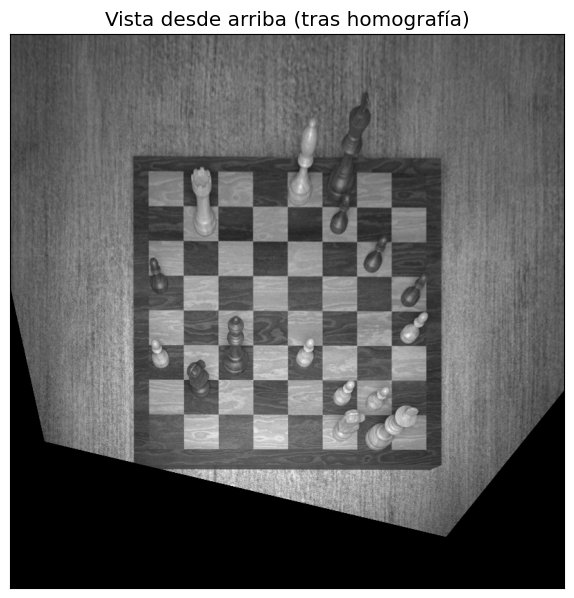

In [ ]:
displayIm(warped, 'Vista desde arriba (tras homografía)', 1.5)

Como se puede ver, obtenemos la vista de arriba con el tablero "rectificado". Vamos a visualizar también los inliers que tenemos calculados por el procedimiento anterior.

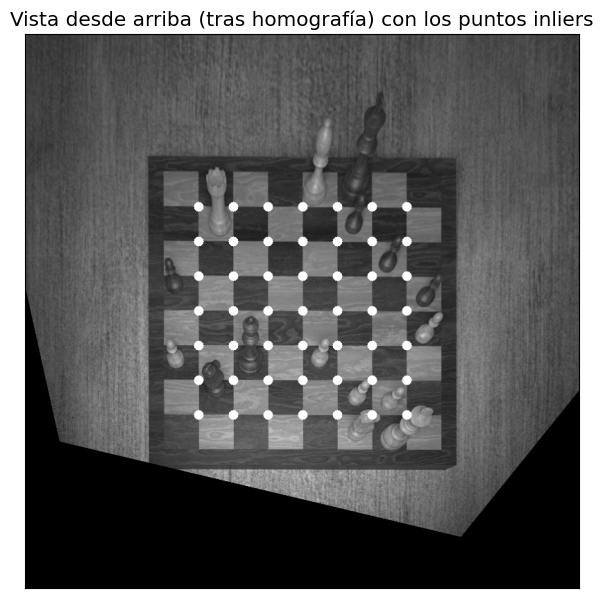

In [ ]:
img_warped_points = warped.copy()
draw_points(img_warped_points, quantized_points, radius=7)
displayIm(img_warped_points, 'Vista desde arriba (tras homografía) con los puntos inliers', 1.5)

Efectivamente son los mismos. Ahora definimos una función para el cómputo de los bordes verticales (ídem para los horizontales). El proceso ya ha sido descrito anteriormente. La función tiene como parámetros la imagen deformada, la máscara que define los bordes, el factor de escala y `x_min, x_max`. Devuelve los `x_min, x_max` del tablero completo y Sobel y Canny para visualizarlos. Igual que en el Canny al principio del detector de bordes, el que usamos aquí tiene parámetros calculados con grid search. En concreto tenemos `threshold1=100` y `threshold2=200`.

In [ ]:
def _compute_vertical_borders(warped: np.ndarray, mask: np.ndarray, scale: np.ndarray, xmin: int, xmax: int) -> typing.Tuple[int, int]:
    # Sobel con kernel de tamaño 3
    G_x = np.abs(cv2.Sobel(warped, cv2.CV_64F, 1, 0,
                           ksize=3))
    # Guardamos Sobel para visualizar
    sobel = G_x.copy()
    # Aplicamos máscara, anulamos bordes
    G_x[~mask] = 0
    # Normalizamos gradiente para que tome valores en [0,255]
    G_x = G_x / G_x.max() * 255
    G_x = G_x.astype(np.uint8)
    # Aplicamos Canny
    G_x = cv2.Canny(G_x, 100, 200)
    # Guardamos Canny para visualizar
    canny = G_x.copy()
    # Aplicamos máscara
    G_x[~mask] = 0

    # Función para encontrar máximos en una banda centrada en la recta x
    # Supresión de no máximos
    def get_nonmax_supressed(x):
        x = (x * scale[0]).astype(np.int32)
        thresh = 2 # Ancho de la banda (mitad)
        return G_x[:, x-thresh:x+thresh+1].max(axis=1)
    # Expandimos hasta encontrar límites del tablero
    while xmax - xmin < 8:
        # Intensidades máximas por la derecha y por la izquierda
        top = get_nonmax_supressed(xmax + 1)
        bottom = get_nonmax_supressed(xmin - 1)
        # Expandimos en dirección de mayores intensidades
        if top.sum() > bottom.sum():
            xmax += 1
        else:
            xmin -= 1

    return xmin, xmax, sobel, canny

Calculamos los bordes verticales.

In [ ]:
xmin, xmax, vertical_sobel, vertical_canny = _compute_vertical_borders(warped, warped_mask, scale, xmin, xmax)

Vamos a visualizar también el Sobel horizontal y el Canny obtenidos en el refinamiento.


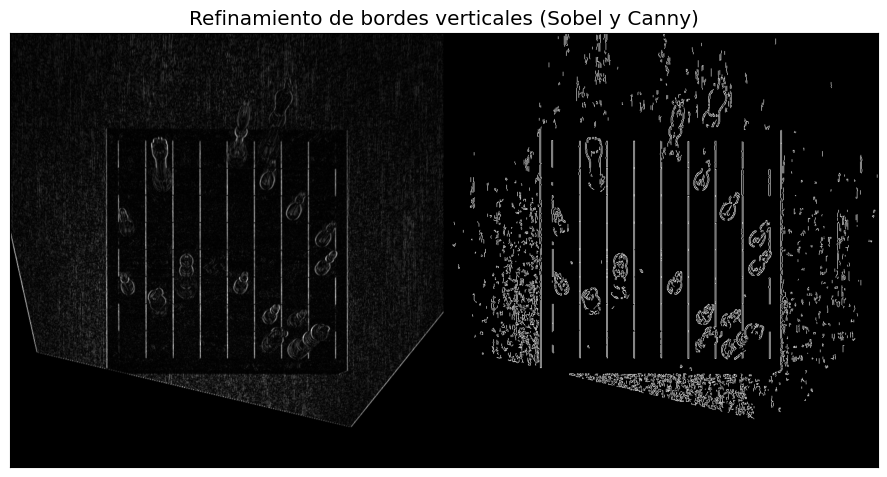

In [ ]:
displayMI_ES([rangeDisplay01(vertical_sobel), rangeDisplay01(vertical_canny)], 'Refinamiento de bordes verticales (Sobel y Canny)', factor=1.75)

Efectivamente vemos como Sobel calcula las intensidades horizontales y Canny detecta los bordes. Hacemos lo mismo con los bordes horizontales, sin comentarlo ya que es idéntico.

In [ ]:
def _compute_horizontal_borders(warped: np.ndarray, mask: np.ndarray, scale: np.ndarray, ymin: int, ymax: int) -> typing.Tuple[int, int]:

    G_y = np.abs(cv2.Sobel(warped, cv2.CV_64F, 0, 1,
                           ksize=3))

    sobel = G_y.copy()

    G_y[~mask] = 0
    G_y = G_y / G_y.max() * 255
    G_y = G_y.astype(np.uint8)
    G_y = cv2.Canny(G_y, 120, 300)

    canny = G_y.copy()

    G_y[~mask] = 0

    def get_nonmax_supressed(y):
        y = (y * scale[1]).astype(np.int32)
        thresh = 2
        return G_y[y-thresh:y+thresh+1].max(axis=0)

    while ymax - ymin < 8:
        top = get_nonmax_supressed(ymax + 1)
        bottom = get_nonmax_supressed(ymin - 1)

        if top.sum() > bottom.sum():
            ymax += 1
        else:
            ymin -= 1

    return ymin, ymax, sobel, canny

Antes de calcular las rectas horizontales, actualizamos la máscara invalidando las regiones fuera de los límites establecidos por las rectas verticales que hemos refinado.

In [ ]:
scaled_xmin, scaled_xmax = (int(x * scale[0]) for x in (xmin, xmax))
warped_mask[:, :scaled_xmin] = warped_mask[:, scaled_xmax:] = False
ymin, ymax, horizontal_sobel, horizontal_canny = _compute_horizontal_borders(warped, warped_mask, scale, ymin, ymax)

Vamos a visualizar Sobel vertical y Canny.

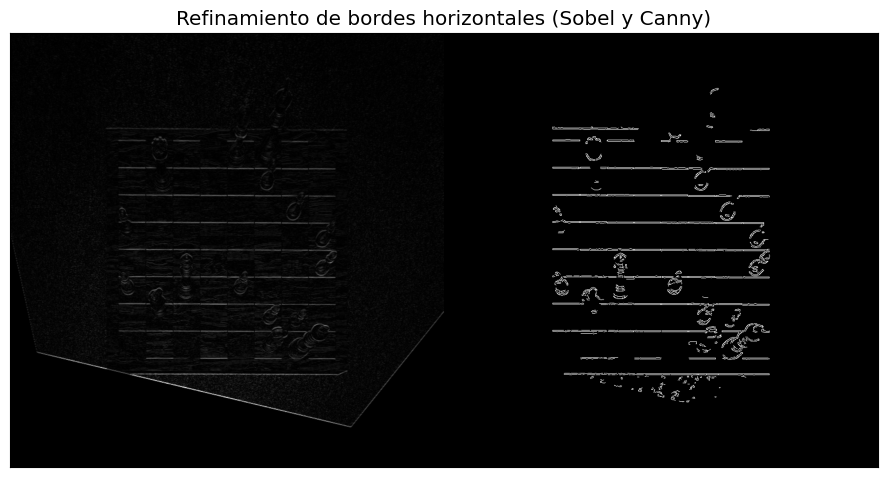

In [ ]:
displayMI_ES([rangeDisplay01(horizontal_sobel), rangeDisplay01(horizontal_canny)], 'Refinamiento de bordes horizontales (Sobel y Canny)', factor=1.75)

Vemos como se detecta todo bien. Ahora que hemos obtenido las esquinas del tablero, solo nos queda obtener las coordenadas de esas esquinas en la imagen original, aplicando la inversa de la matriz de transformación.

In [ ]:
 # Transform boundaries to image space
corners = np.array([[xmin, ymin],
                    [xmax, ymin],
                    [xmax, ymax],
                    [xmin, ymax]]).astype(np.float32)
# Escala
corners = corners * scale
# Esquinas en la imagen original
img_corners = _warp_points(inverse_transformation_matrix, corners)
img_corners /= img_scale
intersection_points /= img_scale

Ahora visualizamos las esquinas calculadas, primero en la malla, después en la imagen original.

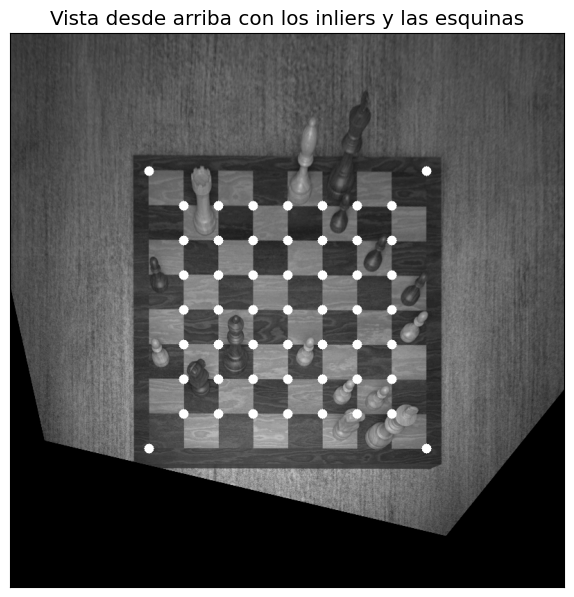

In [ ]:
img_all_points = img_warped_points.copy()
draw_points(img_all_points, corners, radius=7)
displayIm(img_all_points, 'Vista desde arriba con los inliers y las esquinas', 1.5)

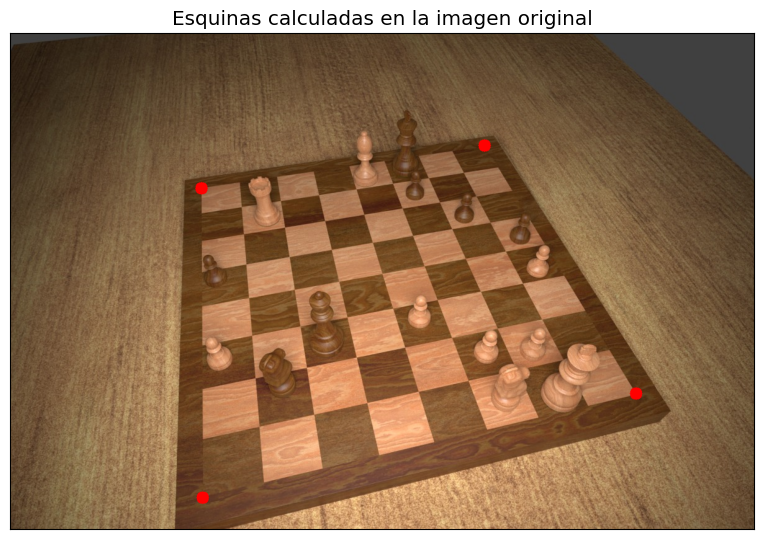

In [ ]:
img_final = img.copy()
draw_points(img_final, img_corners)
displayIm(img_final, 'Esquinas calculadas en la imagen original', 1.5)

Efectivamente, se detectan bastante bien las esquinas. Con esto concluye la etapa de detección del tablero. Las esquinas determinan el tablero completamente, ya que con una homografía a una malla $8\times 8$ podemos obtener de nuevo el tablero "rectificado" y a partir de ese recortar cada casilla del tablero.

## 3.6 Función del detector de tablero

Para que las esquinas que calculemos de cada tablero estén siempre en el mismo orden, crearemos una función que las ordena de alguna forma, en concreto, se ha elegido el orden:
> Arriba izquierda, Arriba derecha, Abajo derecha, Abajo izquierda

In [ ]:
def sort_corner_points(points: np.ndarray) -> np.ndarray:
    """Permute the board corner coordinates to the order [top left, top right, bottom right, bottom left].

    Args:
        points (np.ndarray): the four corner coordinates

    Returns:
        np.ndarray: the permuted array
    """

    # First, order by y-coordinate
    points = points[points[:, 1].argsort()]
    # Sort top x-coordinates
    points[:2] = points[:2][points[:2, 0].argsort()]
    # Sort bottom x-coordinates (reversed)
    points[2:] = points[2:][points[2:, 0].argsort()[::-1]]

    return points

Encapsulamos en una función llamada `find_corners` con lo explicado hasta este momento. La función devolverá las coordenadas de las esquinas (en coordenadas de la imagen de entrada) ordenadas según el orden anterior:

In [ ]:
def find_corners(img: np.ndarray) -> np.ndarray:
    """Determine the four corner points of the chessboard in an image.

    Args:
        img (np.ndarray): the input image (as a numpy array)

    Raises:
        ChessboardNotLocatedException: if the chessboard could not be found

    Returns:
        np.ndarray: the pixel coordinates of the four corners
    """

    # La imagen de entrada se redimensiona a (h=800, w=1200)
    # Si la imagen original ya tiene esas dimensiones no hace nada
    h, w, _ = img.shape
    img_scale = 1200 / w
    dims = (1200, int(h * img_scale))
    img = cv2.resize(img, dims)

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray, 90, 400)
    lines = _detect_lines(edges)
    if lines.shape[0] > 400:
        raise Exception("too many lines in the image")
    all_horizontal_lines, all_vertical_lines = _cluster_lines(lines)

    horizontal_lines = _eliminate_similar_lines(
        all_horizontal_lines, all_vertical_lines)
    vertical_lines = _eliminate_similar_lines(
        all_vertical_lines, all_horizontal_lines)

    all_intersection_points = _get_intersection_points(horizontal_lines,
                                                       vertical_lines)


    best_num_inliers = 0
    best_configuration = None
    iterations = 0
    while iterations < 200 or best_num_inliers < 30:
        row1, row2 = _choose_from_range(len(horizontal_lines))
        col1, col2 = _choose_from_range(len(vertical_lines))
        transformation_matrix = _compute_homography(all_intersection_points,
                                                    row1, row2, col1, col2)
        warped_points = _warp_points(
            transformation_matrix, all_intersection_points)
        warped_points, intersection_points, horizontal_scale, vertical_scale = _discard_outliers(warped_points, all_intersection_points)
        num_inliers = np.prod(warped_points.shape[:-1])
        if num_inliers > best_num_inliers:
            warped_points *= np.array((horizontal_scale, vertical_scale))

            # Quantize and reject deuplicates
            (xmin, xmax, ymin, ymax), scale, quantized_points, intersection_points, warped_img_size = configuration = _quantize_points(warped_points, intersection_points)

            # Calculate remaining number of inliers
            num_inliers = np.prod(quantized_points.shape[:-1])

            if num_inliers > best_num_inliers:
                best_num_inliers = num_inliers
                best_configuration = configuration
        iterations += 1
        if iterations > 10000:
            raise Exception(
                "RANSAC produced no viable results")

    # Retrieve best configuration
    (xmin, xmax, ymin, ymax), scale, quantized_points, intersection_points, warped_img_size = best_configuration

    # Recompute transformation matrix based on all inliers
    transformation_matrix = compute_transformation_matrix(
        intersection_points, quantized_points)
    inverse_transformation_matrix = np.linalg.inv(transformation_matrix)

    # Warp grayscale image
    dims = tuple(warped_img_size.astype(np.int32))
    warped = cv2.warpPerspective(gray, transformation_matrix, dims)
    borders = np.zeros_like(gray)
    borders[3:-3, 3:-3] = 1
    warped_borders = cv2.warpPerspective(borders, transformation_matrix, dims)
    warped_mask = warped_borders == 1

    # Refine board boundaries
    xmin, xmax, _, _ = _compute_vertical_borders(warped, warped_mask, scale, xmin, xmax)
    scaled_xmin, scaled_xmax = (int(x * scale[0]) for x in (xmin, xmax))
    warped_mask[:, :scaled_xmin] = warped_mask[:, scaled_xmax:] = False
    ymin, ymax, _, _ = _compute_horizontal_borders(warped, warped_mask, scale, ymin, ymax)

    # Transform boundaries to image space
    corners = np.array([[xmin, ymin],
                        [xmax, ymin],
                        [xmax, ymax],
                        [xmin, ymax]]).astype(np.float32)
    corners = corners * scale
    img_corners = _warp_points(inverse_transformation_matrix, corners)
    img_corners /= img_scale
    intersection_points /= img_scale
    return sort_corner_points(img_corners)

Podemos comprobar el funcionamiento de la función importando una nueva imagen del dataset de entrenamiento:

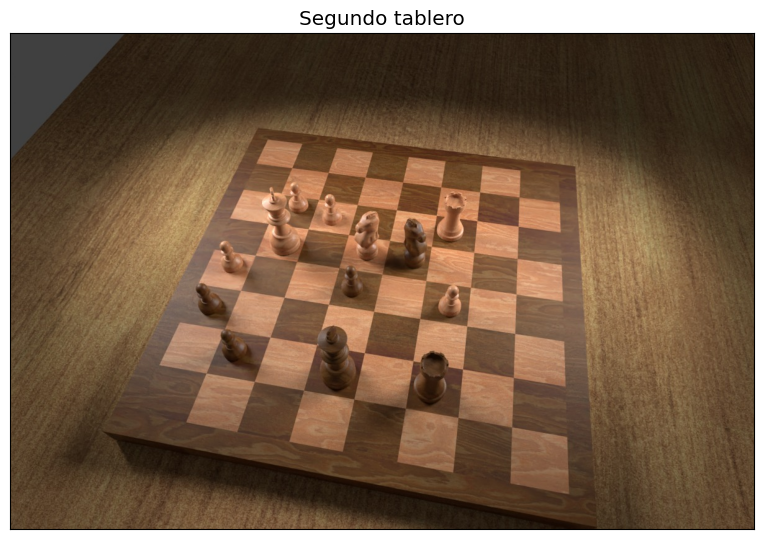

In [ ]:
img = readIm(path/'tablero_2.jpeg')
displayIm(img, 'Segundo tablero', 1.5)

Calculamos las esquinas:

In [ ]:
img_corners = find_corners(img)

Dibujamos las esquinas calculadas:

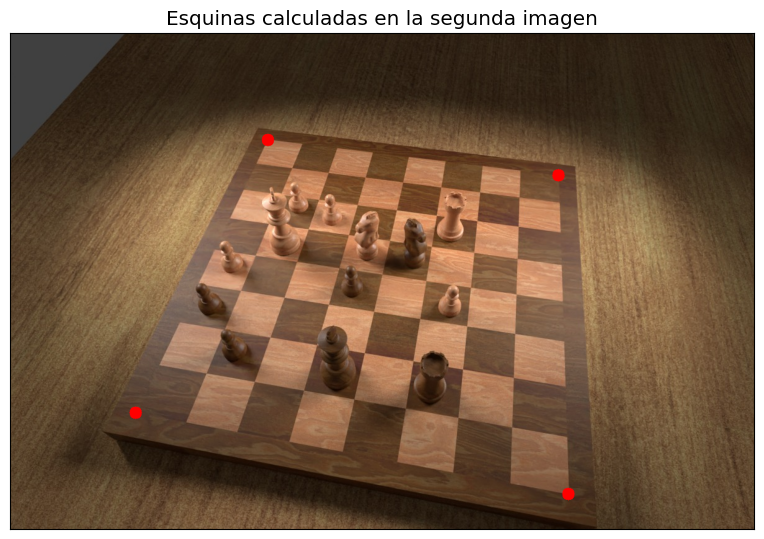

In [ ]:
img_final = img.copy()
draw_points(img_final, img_corners)
displayIm(img_final, 'Esquinas calculadas en la segunda imagen', 1.5)

y obtenemos 4 puntos que se corresponden casi con total exactitud con las esquinas del tablero de juego.  

## 3.7 Evaluación del detector de tablero

Queremos ahora evaluar el funcionamiento del detector de esquinas en el conjunto de validación.

Para ello, compararemos la etiqueta `corners` del archivo json correspondiente a cada tablero con las esquinas predichas. Para facilitar la comparación, ordenamos las esquinas del archivo con la función `sort_corner_points`.

Obviamente, parece prácticamente imposible que el modelo prediga las esquinas con un error de 0 píxeles. Es por ello que consideramos que el cálculo de esquinas comete un error cuando la diferencia de alguna esquina calculada con la esquina real del tablero es mayor de ~1% de la anchura de la imagen.

Como las predicciones se hacen con imágenes con una anchura de 1200, el 1% se puede tomar aproximadamente como 10, que será el umbral de píxeles que elegimos como error:

In [ ]:
def evaluate():

    # Número de errores
    mistakes = 0
    # Número de archivos
    total = 0
    # Error total de píxeles
    running_loss = 0

    # Recorremos el conjunto de validación
    for img_file in glob.glob("./val/*.png"):

        # Lectura de imágenes y JSON asociados
        total += 1
        img = cv2.imread(str(img_file))
        idx = img_file.find(".png")
        stem = img_file[6:idx]
        json_file = f"./val/{stem}.json"
        with open(json_file, "r") as f:
            label = json.load(f)

        # Extraemos las esquinas reales del archivo JSON
        actual = np.array(label["corners"])

        # Calculamos las esquinas con nuestro modelo
        try:
            predicted = find_corners(img)
        except Exception:
            print('exepcion')
            predicted = None

        # Calculamos el error de la predicción
        if predicted is not None:
            actual = sort_corner_points(actual)
            predicted = sort_corner_points(predicted)
            running_loss += np.linalg.norm(actual - predicted, axis=-1)

        if predicted is None or np.linalg.norm(actual - predicted, axis=-1).max() > 10.:
            mistakes += 1

    avg_loss = np.mean(running_loss / total)

    return mistakes, total, avg_loss


mistakes, total, avg_loss = evaluate()
print(f"Total accuracy: {total - mistakes} correct, {mistakes} incorrect, {total} total. {(total - mistakes) / total * 100}% accuracy. Avg euclidean error in pixels: {avg_loss}")

Total accuracy: 146 correct, 0 incorrect, 146 total. 100.0% accuracy. Avg euclidean error in pixels: 1.3588119733730835


Obtenemos que nuestro modelo no comete ningún error en la identificación de las esquinas. Además, el error medio cometido es de menos de 2 píxeles, lo que indica que la identificación de esquinas es además prácticamente perfecta.

Cometer un error medio de menos de 2 píxeles en imágenes bastantes grandes (1200x800 píxeles) y no cometer en ninguna imagen un error de más de 10 píxeles demuestran que la identificación de esquinas del tablero implementada proporciona resultados muy convincentes.

No se evaluará utilizando el conjunto de test, ya que los resultados serán prácticamente los mismos. De hecho, nótese que en el detector del tablero tampoco ha existido un entrenamiento como tal, ya que se trata de un modelo puramente basado en la geometría de las imágenes.

# 4. Clasificador de las casillas según su ocupación

## 4.1 Preprocesado de dataset

En este apartado, tratamos de preprocesar el dataset original para obtener un nuevo dataset apropiado para la tarea de la clasificar las casillas del tablero según si estas están ocupadas o no.



In [ ]:
# Directorio donde se encuentran los tableros
RENDERS_DIR = URI("./")

# Directorio donde guardamos el nuevo dataset
OUT_DIR = URI("./occupancy")

Asociada a cada imagen del conjunto de datos tenemos un archivo .json que contiene información de utiliadad para realizar esta tarea. En particular, usaremos la información acerca de las coordenadas/esquinas de las casillas de las piezas ocupadas, y la cadena en notación FEN, en la cual podemos consultar que casillas del tablero están ocupadas.

De este modo, utilizando la imagen y las esquinas identificadas, calcularemos la transformación que lleva la imagen a una cuadrícula.

Utilizaremos el mismo tamaño para cada cuadrado (50x50), y el tamaño del tablero será lógicamente el mismo (8 * 50 filas y 8 * 50 columnas).

In [ ]:
# **** Constantes para la creación del grid tras la homografía ****

# Tamaño de un cuadrado (50x50)
SQUARE_SIZE = 50

# Tamaño del tablero (8 cuadrados/fila y 8 cuadrados/columna)
# 8*50 x 8*50
BOARD_SIZE = 8 * SQUARE_SIZE

# Tamaño total de la imagen
IMG_SIZE = BOARD_SIZE + 2 * SQUARE_SIZE

La siguiente función `warp_chessboard_image_occupancy` va a permitir transformar la imagen del tablero en una cuadrícula (tal y como veríamos el tablero desde arriba). Para ello, hace uso de las coordenadas de las esquinas comentadas anteriormente.

In [ ]:
def warp_chessboard_image_occupancy(img: np.ndarray, corners: np.ndarray) -> np.ndarray:
    """Warp the image of the chessboard onto a regular grid.

    Args:
        img (np.ndarray): the image of the chessboard
        corners (np.ndarray): pixel locations of the four corner points

    Returns:
        np.ndarray: the warped image
    """

    # Aseguramos de que los puntos de las esquinas estén en el orden correcto
    src_points = sort_corner_points(corners)

    # Definimos los puntos de destino para la transformación en perspectiva.
    # Estos puntos corresponden a las esquinas de una cuadrícula:
    dst_points = np.array([[SQUARE_SIZE, SQUARE_SIZE],  # top left
                           [BOARD_SIZE + SQUARE_SIZE, SQUARE_SIZE],  # top right
                           [BOARD_SIZE + SQUARE_SIZE, BOARD_SIZE + \
                            SQUARE_SIZE],  # bottom right
                           [SQUARE_SIZE, BOARD_SIZE + SQUARE_SIZE]  # bottom left
                           ], dtype=np.float32)

    # Calcula la homografía que mapea los puntos de origen (esquinas del
    # tablero de ajedrez) a los puntos de destino (esquinas de la cuadrícula alineada).
    transformation_matrix, mask = cv2.findHomography(src_points, dst_points)

    # Aplica la transformación de perspectiva utilizando la matriz calculada.
    return cv2.warpPerspective(img, transformation_matrix, (IMG_SIZE, IMG_SIZE))

La función `crop_square_occupancy` se encarga de recortar una casilla concreta de la cuadrícula correspondiente a la imagen deformada que se calcula en la función anterior, dejando un pequeño margen.

La razón por la cual dejamos un pequeño margen en cada recorte es porque de este manera se consiguen mejores resultados.

In [ ]:
def crop_square_occupancy(img: np.ndarray, square: chess.Square, turn: chess.Color) -> np.ndarray:
    """Crop a chess square from the warped input image for occupancy classification.

    Args:
        img (np.ndarray): the warped input image
        square (chess.Square): the square to crop
        turn (chess.Color): the current player

    Returns:
        np.ndarray: the cropped square
    """

    # Determina la fila y la columna del cuadrado en la notación estándar de ajedrez.
    rank = chess.square_rank(square)
    file = chess.square_file(square)

    # Ajusta la posición del cuadrado según la perspectiva del jugador.
    # - Si es el turno de las BLANCAS, el tablero está orientado normalmente (el rango 0 está en la parte inferior).
    # - Si es el turno de las NEGRAS, el tablero está invertido (el rango 7 está en la parte inferior).
    if turn == chess.WHITE:
        row, col = 7 - rank, file
    else:
        row, col = rank, 7 - file

    # Recorta la región correspondiente al cuadrado.
    # Se añade un pequeño margen alrededor del cuadrado (de 0.5 a 2.5 cuadrados).
    return img[int(SQUARE_SIZE * (row + .5)): int(SQUARE_SIZE * (row + 2.5)),
               int(SQUARE_SIZE * (col + .5)): int(SQUARE_SIZE * (col + 2.5))]

La función `_extract_squares_from_sample_occupancy` se encarga de procesar cada casilla del tablero de una imagen. Por tanto, para cada casilla:

- Determina si está ocupada o no.
- Recorta la zona correspondiente de la imagen transformada usando `crop_square_occupancy`.
- Guarda la imagen recortada en el directorio correspondiente.

In [ ]:
def _extract_squares_from_sample_occupancy(id: str, subset: str = "", input_dir: Path = RENDERS_DIR, output_dir: Path = OUT_DIR):

    # Carga la imagen del tablero de ajedrez utilizando OpenCV.
    img = cv2.imread(str(input_dir / subset / (id + ".png")))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Carga los metadatos (archivo JSON) para el tablero de ajedrez.
    with (input_dir / subset / (id + ".json")).open("r") as f:
        label = json.load(f)

    # Extrae las esquinas del tablero de ajedrez de los metadatos y los convierte a un array de NumPy
    corners = np.array(label["corners"], dtype=np.float32)

    # Transforma la imagen del tablero de ajedrez a una cuadrícula regular
    unwarped = warp_chessboard_image_occupancy(img, corners)

    # Carga el estado del tablero utilizando la cadena FEN de los metadatos
    board = chess.Board(label["fen"])

    # Recorre los 64 cuadrados del tablero de ajedrez
    for square in chess.SQUARES:

        # Determina si el cuadrado está "ocupado" o "vacío" según el estado del tablero
        target_class = "empty" if board.piece_at(
            square) is None else "occupied"

        # Recorta la imagen del cuadrado específico del tablero transformado
        piece_img = crop_square_occupancy(unwarped, square, label["white_turn"])

        # Guarda la imagen del cuadrado recortado en el directorio de salida
        with Image.fromarray(piece_img, "RGB") as piece_img:
            piece_img.save(output_dir / subset / target_class /
                           f"{id}_{chess.square_name(square)}.png")

La función `create_dataset_occupancy` se encarga de crear el dataset completo para esta tarea. Para ello, llama a la función anterior para cada imagen de los tres conjuntos de datos (entrenamiento, validación y test).

In [ ]:
def create_dataset_occupancy(input_dir: Path = RENDERS_DIR, output_dir: Path = OUT_DIR):
    """Create the occupancy classification dataset.

    Args:
        input_dir (Path, optional): the input folder of the rendered images. Defaults to ``data://render``.
        output_dir (Path, optional): the output folder. Defaults to ``data://occupancy``.
    """

    # Recorre los subconjuntos (entrenamiento, validación, prueba)
    for subset in ("train", "val", "test"):

        # Crea directorios para cada clase (vacío, ocupado) dentro del subconjunto actual
        for c in ("empty", "occupied"):
            folder = output_dir / subset / c
            shutil.rmtree(folder, ignore_errors=True)
            os.makedirs(folder, exist_ok=True)

        # Reune todos los archivos `.png` en el directorio del subconjunto
        samples = list((input_dir / subset).glob("*.png"))

        # Procesa cada muestra
        for i, img_file in enumerate(samples):
            # Imprime el progreso cada 1% del conjunto de datos procesado
            if len(samples) > 100 and i % int(len(samples) / 100) == 0:
                print(f"{i / len(samples)*100:.0f}%")

            # Extrae cuadrados individuales de la imagen del tablero de ajedrez y los guardar en el directorio de salida
            _extract_squares_from_sample_occupancy(img_file.stem, subset, input_dir, output_dir)

Procedemos a la creación del dataset:

In [ ]:
create_dataset_occupancy()

0%
1%
2%
3%
4%
5%
6%
7%
8%
9%
10%
11%
12%
13%
14%
15%
16%
17%
18%
19%
20%
21%
22%
23%
24%
25%
26%
27%
28%
29%
30%
31%
32%
33%
34%
35%
36%
37%
38%
39%
40%
41%
42%
43%
44%
45%
46%
47%
48%
49%
50%
51%
52%
53%
54%
55%
56%
57%
58%
59%
60%
61%
62%
63%
64%
65%
66%
67%
68%
69%
70%
71%
72%
73%
74%
75%
76%
77%
78%
79%
80%
81%
82%
83%
84%
85%
86%
87%
88%
89%
90%
91%
92%
93%
94%
95%
96%
97%
98%
99%
0%
1%
1%
2%
3%
3%
4%
5%
5%
6%
7%
8%
8%
9%
10%
10%
11%
12%
12%
13%
14%
14%
15%
16%
16%
17%
18%
18%
19%
20%
21%
21%
22%
23%
23%
24%
25%
25%
26%
27%
27%
28%
29%
29%
30%
31%
32%
32%
33%
34%
34%
35%
36%
36%
37%
38%
38%
39%
40%
40%
41%
42%
42%
43%
44%
45%
45%
46%
47%
47%
48%
49%
49%
50%
51%
51%
52%
53%
53%
54%
55%
55%
56%
57%
58%
58%
59%
60%
60%
61%
62%
62%
63%
64%
64%
65%
66%
66%
67%
68%
68%
69%
70%
71%
71%
72%
73%
73%
74%
75%
75%
76%
77%
77%
78%
79%
79%
80%
81%
82%
82%
83%
84%
84%
85%
86%
86%
87%
88%
88%
89%
90%
90%
91%
92%
92%
93%
94%
95%
95%
96%
97%
97%
98%
99%
99%
0%
1%
2%
3%
4%
4%
5%
6%
7%
8%
9%
10%
11%

Se crea un archivo comprimido para subirlo a Drive y facilitar el uso del dataset en futuras ejecuciones:

In [ ]:
# Comprimir una carpeta o archivo
shutil.make_archive('/content/occupancy_compressed', 'zip', '/content/occupancy')

'/content/occupancy_compressed.zip'

In [ ]:
!unzip "/content/drive/My Drive/Colab Notebooks/VC/Proyecto/occupancy_compressed.zip" -d "/content/occupancy"

Se han truncado las últimas 5000 líneas del flujo de salida.
  inflating: /content/occupancy/test/occupied/0987_e6.png  
  inflating: /content/occupancy/test/occupied/0284_g7.png  
  inflating: /content/occupancy/test/occupied/4503_g2.png  
  inflating: /content/occupancy/test/occupied/0316_a7.png  
  inflating: /content/occupancy/test/occupied/0583_h7.png  
  inflating: /content/occupancy/test/occupied/2614_h2.png  
  inflating: /content/occupancy/test/occupied/3254_d2.png  
  inflating: /content/occupancy/test/occupied/3834_f3.png  
  inflating: /content/occupancy/test/occupied/1848_f7.png  
  inflating: /content/occupancy/test/occupied/0987_c4.png  
  inflating: /content/occupancy/test/occupied/1338_d2.png  
  inflating: /content/occupancy/test/occupied/1887_d6.png  
  inflating: /content/occupancy/test/occupied/3500_h4.png  
  inflating: /content/occupancy/test/occupied/4571_g5.png  
  inflating: /content/occupancy/test/occupied/0803_a5.png  
  inflating: /content/occupancy/test/oc

## 4.2 Entrenamiento

Vamos a comenzar con el proceso de entrenamiento en el que vamos a tratar de entrenar 2 modelos que hemos considerado adecuados. En primer lugar una CNN definida manualmente, y luego vamos a comprobar si esta es capaz de superar a la RESNET18 haciendo uso de los parámetros preentrenados con un fine_tune y elegiremos el modelo de los 2 que mejor resultado obtenga para la definición del cauce final que se va a encargar de realizar las tres tareas en una sola vez.

Vamos a hacer uso de la función de `plot_metrics` proporcionada por el profesor en las prácticas individuales a lo largo del curso por simple comodidad y para poder visualizar todo el proceso de entrenamiento a la perfección y de una manera más sencilla e intuitiva.

In [ ]:
# Function to display evaluation metrics

@patch
@delegates(subplots)
def plot_metrics(self: Recorder, nrows=None, ncols=None, figsize=None, **kwargs):
    metrics = np.stack(self.values)
    names = self.metric_names[1:-1]
    n = len(names) - 1
    if nrows is None and ncols is None:
        nrows = int(math.sqrt(n))
        ncols = int(np.ceil(n / nrows))
    elif nrows is None: nrows = int(np.ceil(n / ncols))
    elif ncols is None: ncols = int(np.ceil(n / nrows))
    figsize = figsize or (ncols * 6, nrows * 4)
    fig, axs = subplots(nrows, ncols, figsize=figsize, **kwargs)
    axs = [ax if i < n else ax.set_axis_off() for i, ax in enumerate(axs.flatten())][:n]
    for i, (name, ax) in enumerate(zip(names, [axs[0]] + axs)):
        ax.plot(metrics[:, i], color='#1f77b4' if i == 0 else '#ff7f0e', label='valid' if i > 0 else 'train')
        ax.set_title(name if i > 1 else 'losses')
        ax.legend(loc='best')
    plt.show()

Definimos las rutas a los conjuntos de entrenamiento y validación.

In [ ]:
# Definir la ruta principal donde están las carpetas 'train' y 'valid'
path = Path('./occupancy')

# Obtener las imágenes de las carpetas 'train' y 'valid'
train_path = path / 'train'
valid_path = path / 'val'

Creamos el DataBlock y el Dataloader de la CNN básica. Esta tiene como entrada imágenes de $100 \times 100$ píxeles así que hacemos `item_tfms=Resize(100)`. Usamos `CategoryBlock` ya que tenemos un problema de clasificación, las etiquetas se obtienen directamente de las carpetas y los conjuntos de entrenamiento y validación ya están separados en carpetas distintas, de modo que usamos `GrandparentSplitter`. Usaremos tamaño de batch $32$, que es un tamaño no muy grande bastante bueno por defecto. También visualizamos un batch.

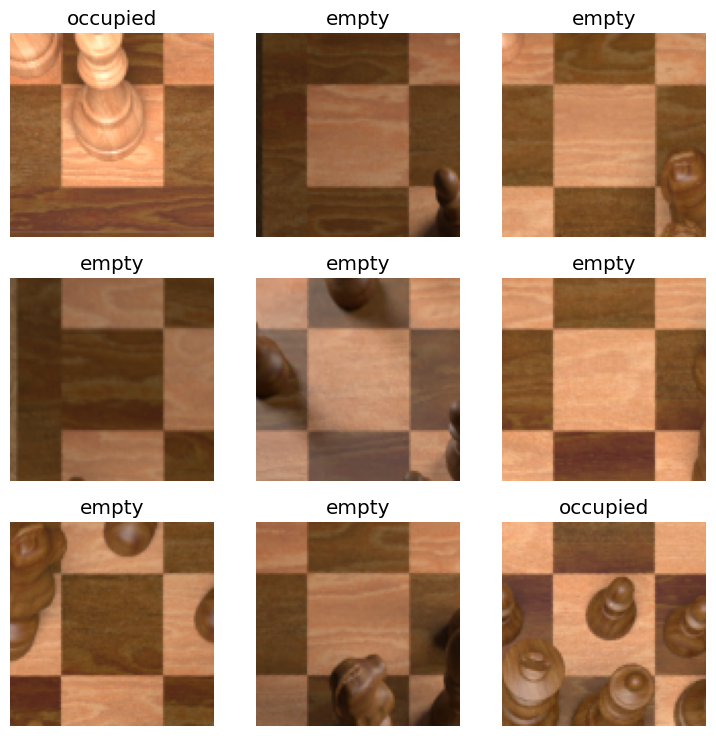

In [ ]:
# Crear el DataBlock para clasificación binaria
dblock_cnn_100 = DataBlock(
    blocks=(ImageBlock, CategoryBlock),  # Imágenes y categorías
    get_items=get_image_files,  # Obtener las imágenes de los directorios
    get_y=parent_label,  # Etiquetas basadas en los nombres de las carpetas (occupied/empty)
    item_tfms=Resize(100, method='squish'),
    splitter=GrandparentSplitter(train_name='train', valid_name='val')  # Dividir entre 'train' y 'val'
)

# Crear los DataLoaders utilizando los directorios de entrenamiento y validación
dls_cnn_100 = dblock_cnn_100.dataloaders(path, bs=32)

# Mostrar un batch de imágenes
dls_cnn_100.show_batch()

Como podemos ver, tenemos ejemplos de casillas ocupadas y vacías, recortadas de forma que tenemos información contextual alrededor.

Ahora definimos el propio modelo, creamos el Learner y enseñamos su resumen. La CNN básica tiene una arquitectura muy simple, tenemos 3 capas de convolución, 3 de MaxPooling y 3 densas en la cabecera. Usamos funciones de activación ReLU y aumentamos los canales en las capas convolucionales posteriores siguiendo la heurística bastante buena de canales que son potencias de dos. Esto nos permite aprender características más complejas en las capas superiores.

En el `Learner` usamos optimizador Adam, que es el establecido por defecto, y función de pérdida `CrossEntropyLossFlat`, que como ya sabemos es la adecuada para nuestro problema. Como métricas usaremos accuracy y F1-score ponderado (tenemos en cuenta que hay muchas más casillas vacías que ocupadas).

In [ ]:
# Define CNN model directly using nn.Sequential
cnn_100 = nn.Sequential(

    # Convolutional and pooling layers
    nn.Conv2d(3, 16, 5),  # Input: 3x100x100, Output: 16x96x96
    nn.ReLU(),
    nn.MaxPool2d(2, 2),  # Output: 16x48x48

    nn.Conv2d(16, 32, 5),  # Output: 32x44x44
    nn.ReLU(),
    nn.MaxPool2d(2, 2),  # Output: 32x22x22

    nn.Conv2d(32, 64, 3),  # Output: 64x20x20
    nn.ReLU(),
    nn.MaxPool2d(2, 2),  # Output: 64x10x10

    # Flatten layer
    nn.Flatten(),  # Converts 4D tensor to 1D tensor

    # Fully connected layers
    nn.Linear(64 * 10 * 10, 1000),
    nn.ReLU(),
    nn.Linear(1000, 256),
    nn.ReLU(),
    nn.Linear(256, 2)  # Output layer for 2 classes
)


learn_cnn_100 = Learner(
    dls_cnn_100,
    cnn_100,
    loss_func=CrossEntropyLossFlat(),
    opt_func=Adam,
    metrics=[accuracy, F1Score(average='weighted')]
)


learn_cnn_100.summary()

Sequential (Input shape: 32 x 3 x 100 x 100)
Layer (type)         Output Shape         Param #    Trainable 
                     32 x 16 x 96 x 96   
Conv2d                                    1216       True      
ReLU                                                           
____________________________________________________________________________
                     32 x 16 x 48 x 48   
MaxPool2d                                                      
____________________________________________________________________________
                     32 x 32 x 44 x 44   
Conv2d                                    12832      True      
ReLU                                                           
____________________________________________________________________________
                     32 x 32 x 22 x 22   
MaxPool2d                                                      
____________________________________________________________________________
                     32 x 64 x 

Como podemos ver, tenemos casi $7$ millones de parámetros y todos son entrenables. Ahora hacemos `lr_find()` para encontrar un learning rate bueno.

/usr/local/lib/python3.10/dist-packages/fastai/learner.py:53: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwargs

Best Learning Rate found: 0.00013182566908653826


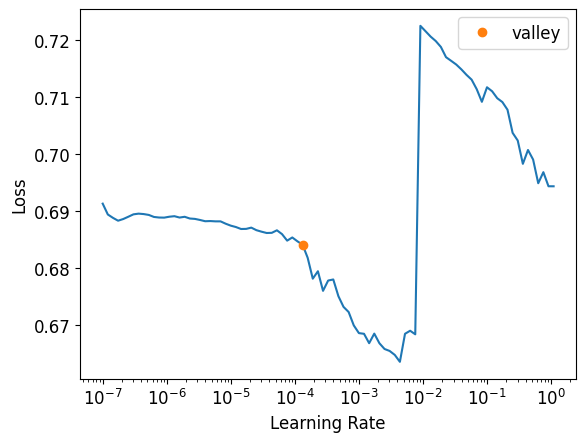

In [ ]:
lr = learn_cnn_100.lr_find();
print('Best Learning Rate found:', lr[0])

Nos quedamos con `lr[0]` ya que parece razonable y entrenamos con `fit_one_cycle()`. Entrenaremos solo durante $5$ épocas para evitar sobreajuste.

In [ ]:
learn_cnn_100.fit_one_cycle(
    n_epoch=5,
    lr_max=lr[0]
)

epoch,train_loss,valid_loss,accuracy,f1_score,time
0,0.032528,0.029417,0.989726,0.989719,12:17
1,0.018251,0.013538,0.994542,0.994541,11:43
2,0.010534,0.009679,0.996896,0.996894,11:41
3,0.001150,0.007829,0.997539,0.997538,11:27
4,0.002139,0.007290,0.997539,0.997538,11:37


El resultado es muy bueno, tenemos accuracy y F1-score prácticamente idénticos, alrededor de $99.7$%. Veamos las métricas con gráficas.

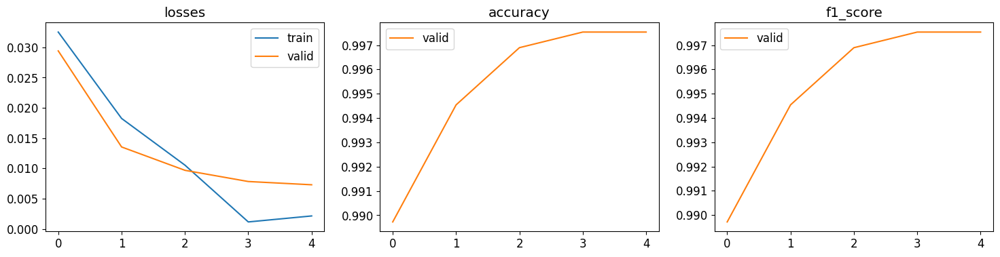

In [ ]:
learn_cnn_100.recorder.plot_metrics()

Viendo la evolución de las funciones de pérdida parece que tenemos un poco de sobreajuste. Aun así el resultado obtenido es bastante bueno, las métricas en validación son casi $100$%. Vamos a guardar el modelo y procedemos a entrenar la Resnet18.

In [ ]:
learn_cnn_100.export('occupancy_cnn100.pkl')

Creamos el Datablock y el Dataloader que vamos a usar para entrenar con Resnet 18. Hay que decir que redimensionamos las imágenes a 224x224 porque sino obtenemos un resultado erróneo. Añadimos el método squish porque si lo dejamos por defecto obtenemos las imágenes cortadas y entonces no podría entender bien el modelo las piezas que deberían.

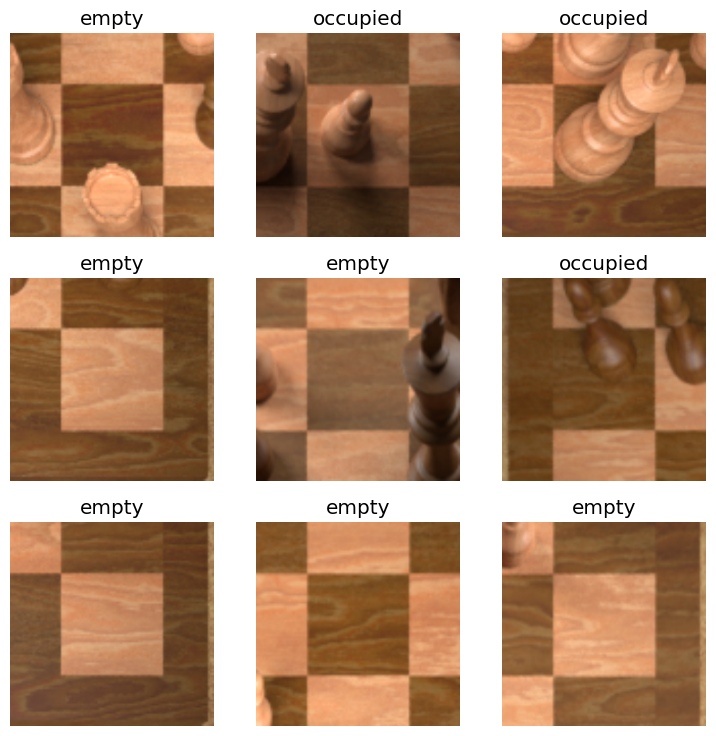

In [ ]:
# Crear el DataBlock para clasificación binaria
dblock_resnet_18 = DataBlock(
    blocks=(ImageBlock, CategoryBlock),  # Imágenes y categorías
    get_items=get_image_files,  # Obtener las imágenes de los directorios
    get_y=parent_label,  # Etiquetas basadas en los nombres de las carpetas (occupied/empty)
    item_tfms=Resize(224, method='squish'),
    splitter=GrandparentSplitter(train_name='train', valid_name='val')  # Dividir entre 'train' y 'val'
)

# Crear los DataLoaders utilizando los directorios de entrenamiento y validación
dls_resnet_18 = dblock_resnet_18.dataloaders(path, bs=32)

# Mostrar un batch de imágenes
dls_resnet_18.show_batch()

Definimos el learner para realizar la tarea de ocupación de las casillas haciendo uso de Resnet 18.

Algunos comentarios sobre el learner es que hacemos uso de CrossEntropyLossFlat ya que esta está diseñada para usarse en problema tanto binarios como con más clases en lugar de la Entropía Binaria debido a que queríamos ser fieles al proceso de trabajo realizado por Wölflein y debido a que al hacer uso de la otra función de pérdida obteníamos datos que no se correspondían para nada con lo que debíamos obtener mientras que con la primera de las funciones de pérdida sí que obtenímos los datos que debíamos obtener.

In [ ]:
learn_resnet_18 = vision_learner(
    dls_resnet_18,
    resnet18,
    pretrained=True,
    train_bn=False,
    loss_func=CrossEntropyLossFlat(),
    opt_func=Adam,
    metrics=[accuracy, F1Score(average='weighted')]
)

learn_resnet_18.summary()

Sequential (Input shape: 32 x 3 x 224 x 224)
Layer (type)         Output Shape         Param #    Trainable 
                     32 x 64 x 112 x 112 
Conv2d                                    9408       False     
BatchNorm2d                               128        False     
ReLU                                                           
____________________________________________________________________________
                     32 x 64 x 56 x 56   
MaxPool2d                                                      
Conv2d                                    36864      False     
BatchNorm2d                               128        False     
ReLU                                                           
Conv2d                                    36864      False     
BatchNorm2d                               128        False     
Conv2d                                    36864      False     
BatchNorm2d                               128        False     
ReLU                      

Entrenamos haciendo uso de un fine_tune con una época de congelamiento en el cuerpo y luego de 5 épocas debido a que podemos ver que los modelos entrenan bastante rápido y suelen tardar casi 20 minutos por época.

In [ ]:
learn_resnet_18.fine_tune(
    epochs=5,
    freeze_epochs=1,
    cbs=[EarlyStoppingCallback(monitor='accuracy', patience=5)]
)

epoch,train_loss,valid_loss,accuracy,f1_score,time
0,0.219353,0.146918,0.942851,0.943055,05:13


epoch,train_loss,valid_loss,accuracy,f1_score,time
0,0.004034,0.003383,0.999251,0.999251,18:56
1,0.002722,0.000899,0.999679,0.999679,18:55
2,0.000200,0.000908,0.999465,0.999465,18:54
3,0.000110,0.000085,1.000000,1.000000,18:53
4,0.000001,0.000032,1.000000,1.000000,18:50


Podemos ver que obtenemos unos datos perfecto en el entrenamiento porque llegamos a un $100\%$ en validación. También vamos a enseñar las gráficas de las métricas aunque viendo los resuotados obtenidos no van a ser nada de útiles.

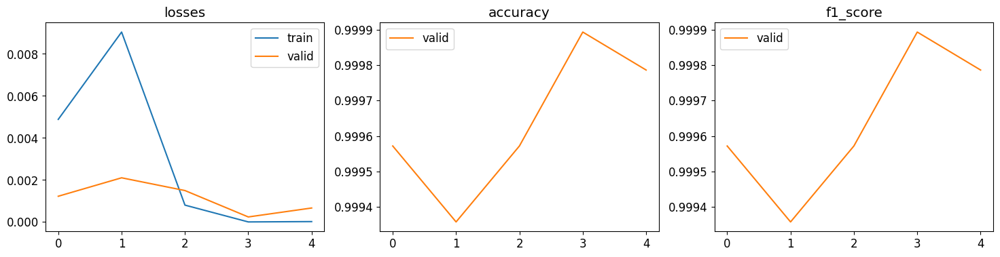

In [ ]:
learn_resnet_18.recorder.plot_metrics()

También hemos guardado el modelo en el disco y lo hemos cargado porque entrenamos el modelo y luego probamos a ejecutarlo en el test también por ver cómo salen en el conjunto de test.

In [ ]:
# Export the model to the specified path
learn_resnet_18.export('occupancy_resnet18.pkl')

In [ ]:
learn_resnet_18 = load_learner('occupancy_resnet18.pkl')

In [ ]:
resize_transform = Resize(224, method='squish')
files_test = get_image_files('./occupancy/test')

dls_test = learn_resnet_18.dls.test_dl(files_test, with_labels=True, transforms=[resize_transform])

results = compute_metrics(learn_resnet_18, [dls_test], names_dl=['test'])
print_metrics(results)

Métricas para test:
  Accuracy: 0.99968
  F1-score (weighted): 0.99968
  Precision (weighted): 0.99968
  Recall (weighted): 0.99968


# 5. Clasificador de las piezas en las casillas ocupadas

Crearemos ahora el clasificador de las piezas. La función de este modelo será determinar, para las casillas predichas como ocupadas por el clasificador anterior, qué pieza hay en dicha casilla.

Observando la ejecución de `show_batch` en la creación del dataset de ocupación se puede observar que, si nos limitamos a realizar el recorte anterior, los resultados no van a ser buenos. En muchas imágenes, se recorta una parte de la pieza, especialmente la parte de arriba de la pieza, que es un rasgo muy distintivo de cada pieza y permite identificarlas.

Por tanto, el dataset que tendremos que crear para la identificación de piezas será distinto al anterior. El recorte deberá incluir una mayor parte de la imagen, asegurándonos de que la pieza aparezca completa en cada recorte.

## 5.1 Preprocesado de dataset

Para facilitar la creación de las etiquetas del nuevo dataset, creamos dos funciones auxiliares, que dada una pieza de la librería de `chess`, devuelve el nombre de la pieza:

In [ ]:
def color_name(color: chess.Color) -> str:
    """Convert a chess color to a string.

    Args:
        color (chess.Color): the color

    Returns:
        str: the string representation
    """
    return {chess.WHITE: "white",
            chess.BLACK: "black"}[color]


def piece_name(piece: chess.Piece) -> str:
    """Convert a chess piece to a string.

    Args:
        piece (chess.Piece): the piece

    Returns:
        str: the corresponding string
    """
    return f"{color_name(piece.color)}_{chess.piece_name(piece.piece_type)}"

Pasamos a la creación del dataset. Nótese que, al igual que en el anterior dataset, crearemos el dataset utilizando las esquinas identificadas en el archivo json de cada tablero.

De esta forma, garantizamos que la calidad del dataset creado sea la mejor posible.

In [ ]:
# Directorio donde se encuentran los tableros
RENDERS_DIR = URI("./")

# Directorio donde guardamos el nuevo dataset
OUT_DIR = URI("./piece_classifier")

El proceso realizado será similar al realizado en el dataset de ocupación.
Utilizando la imagen y las esquinas identificadas, calcularemos la transformación que lleva la imagen a una cuadrícula.

Utilizaremos el mismo tamaño para cada cuadrado (50x50), y el tamaño del tablero será lógicamente el mismo (8 * 50 filas y 8 * 50 columnas).

Sin embargo, en este caso, los márgenes que dejaremos en la cuadrícula serán más grandes que solo 1 cuadrado por cada lado. En este caso, se dejará la mitad del tablero (4 cuadrados) por cada lado (izquierda, derecha, abajo y arriba), lo que permitirá recortar posteriormente los cuadrados sin cortar ninguna pieza.

In [ ]:
# **** Constantes para la creación del grid tras la homografía ****

# Tamaño de un cuadrado (50x50)
SQUARE_SIZE = 50

# Tamaño del tablero (8 cuadrados/fila y 8 cuadrados/columna)
# 8*50 x 8*50
BOARD_SIZE = 8 * SQUARE_SIZE

# Dejamos mucho margen (8*50 / 2 por cada arriba, por abajo, izquierda y derecha del tablero)
IMG_SIZE = BOARD_SIZE * 2
MARGIN = (IMG_SIZE - BOARD_SIZE) / 2

In [ ]:
def warp_chessboard_image_piece_classifier(img: np.ndarray, corners: np.ndarray) -> np.ndarray:
    """Warp the image of the chessboard onto a regular grid.

    Args:
        img (np.ndarray): the image of the chessboard
        corners (np.ndarray): pixel locations of the four corner points

    Returns:
        np.ndarray: the warped image
    """

    # Ordenamos las esquinas
    src_points = sort_corner_points(corners)

    # Mapeamos las esquinas a la cuadrícula dejando los márgenes correspondientes
    dst_points = np.array([[MARGIN, MARGIN],  # top left
                           [BOARD_SIZE + MARGIN, MARGIN],  # top right
                           [BOARD_SIZE + MARGIN, \
                            BOARD_SIZE + MARGIN],  # bottom right
                           [MARGIN, BOARD_SIZE + MARGIN]  # bottom left
                           ], dtype=np.float32)

    # Calculamos la homografía y devolvemos la transformación por la matriz de la imagen
    transformation_matrix, mask = cv2.findHomography(src_points, dst_points)
    return cv2.warpPerspective(img, transformation_matrix, (IMG_SIZE, IMG_SIZE))

Una vez calculada la correspondiente cuadrícula para el tablero, pasamos a recortar cada cuadrado, dejando suficiente espacio en cada recorte.

Se puede ver en el apartado 3.4 que la homografía provoca una deformación en la imagen, especialmente en los extremos del tablero.

Este efecto provoca que en las posiciones más elevadas del tablero tengamos que realizar un recorte con una altura más elevada que en posición más bajas. Es por ello que realizaremos el recortado de la siguiente forma: en las posiciones más bajas se recortará un cuadrado más por arriba en cada pieza, mientras que en las posiciones más elevadas se recortará tres cuadrados más por arriba en cada pieza. En posiciones intermedias, se elegirá un valor entre 1 y 3 de forma lineal.

Algo similar ocurre horizontalmente. En las piezas situadas a la izquierda en el tablero, muchas piezas ocupan parte de la casilla a su izquierda. Este efecto es más notorio a medida que nos vamos a las primeras columnas. Por ello, recortaremos en las piezas más a la izquierda (1ª columna) un cuadrado a la izquierda de cada pieza. En las piezas en la cuarta columna recortaremos por la izquierda una distancia que sea igual a una cuarta parte de un cuadrado. En columnas intermedias, se elige un valor intermedio linealmente.

Se hará el mismo proceso aumentando a la derecha en las últimas columnas, ya que muchas piezas ocupan parte de su casilla a la derecha. En este caso, este efecto es más notable a medida que la pieza está más a la derecha.

Por último, si la pieza estaba en las primeras 4 columnas, al haberle añadido a la izquierda una zona para realizar el recortado, la pieza queda a la derecha de la imagen.

Se ha comprobado que, como en muchas imágenes, aparecen varias piezas, el clasificador puede confundirse con otras piezas si la pieza a identificar no queda siempre en el mismo lugar en todas las imágenes. Es por ello que realizaremos en estos casos un volteado de la imagen horizontalmente (`cv2.flip`) para que la pieza a identificar quede siempre a la izquierda.

In [ ]:
# **** Constantes para el recorte ****
MIN_HEIGHT_INCREASE, MAX_HEIGHT_INCREASE = 1, 3
MIN_WIDTH_INCREASE, MAX_WIDTH_INCREASE = .25, 1

# Tamaño de salida: (1+1)*50 = 100 x 200 = (1+3)*50
OUT_WIDTH = int((1 + MAX_WIDTH_INCREASE) * SQUARE_SIZE)
OUT_HEIGHT = int((1 + MAX_HEIGHT_INCREASE) * SQUARE_SIZE)

In [ ]:
def crop_square_piece_classifier(img: np.ndarray, square: chess.Square, turn: chess.Color) -> np.ndarray:
    """Crop a chess square from the warped input image for piece classification.

    Args:
        img (np.ndarray): the warped input image
        square (chess.Square): the square to crop
        turn (chess.Color): the current player

    Returns:
        np.ndarray: the cropped square
    """

    # Devuelve la fila del cuadrado (empezando desde abajo si turno = WHITE)
    rank = chess.square_rank(square)

    # Devuelve la columna del cuadrado (empezando desde la izquierda si turno = WHITE)
    file = chess.square_file(square)

    # Se cambian las filas y columnas para que se empiece siempre por arriba a la izquierda
    # En general, elegiremos siempre turn = chess.WHITE
    if turn == chess.WHITE:
        row, col = 7 - rank, file
    else:
        row, col = rank, 7 - file

    # Se aumenta la altura linealmente
    # Si la casilla está arriba del tablero en MAX_HEIGHT_INCREASE
    # Si la casilla está abajo del tablero en MIN_HEIGHT_INCREASE
    # En las casillas intermedias, se elige una cantidad entre MIN_HEIGHT_INCREASE y MAX_HEIGHT_INCREASE
    height_increase = MIN_HEIGHT_INCREASE + \
        (MAX_HEIGHT_INCREASE - MIN_HEIGHT_INCREASE) * ((7 - row) / 7)

    # Se aumenta la anchura por la izquierda en las primeras 4 columnas
    # Si la casilla está en la primera columna del tablero en MAX_WIDTH_INCREASE
    # Si la casilla está en la cuarta columna del tablero en MIN_WIDTH_INCREASE
    # En las casillas intermedias, se elige una cantidad entre MIN_WIDTH_INCREASE y MAX_WIDTH_INCREASE
    left_increase = 0 if col >= 4 else MIN_WIDTH_INCREASE + \
        (MAX_WIDTH_INCREASE - MIN_WIDTH_INCREASE) * ((3 - col) / 3)

    # Se aumenta la anchura por la derecha en las últimas 4 columnas
    # Si la casilla está en la cuarta columna del tablero en MIN_WIDTH_INCREASE
    # Si la casilla está en la última columna del tablero en MAX_WIDTH_INCREASE
    # En las casillas intermedias, se elige una cantidad entre MIN_WIDTH_INCREASE y MAX_WIDTH_INCREASE
    right_increase = 0 if col < 4 else MIN_WIDTH_INCREASE + \
        (MAX_WIDTH_INCREASE - MIN_WIDTH_INCREASE) * ((col - 4) / 3)

    # A partir de lo anterior, se realiza el recortado
    x1 = int(MARGIN + SQUARE_SIZE * (col - left_increase))
    x2 = int(MARGIN + SQUARE_SIZE * (col + 1 + right_increase))
    y1 = int(MARGIN + SQUARE_SIZE * (row - height_increase))
    y2 = int(MARGIN + SQUARE_SIZE * (row + 1))
    width = x2-x1
    height = y2-y1
    cropped_piece = img[y1:y2, x1:x2]

    # Si la pieza está en las 4 primeras columnas se realiza un flip para dejar
    # la pieza a la izquierda
    if col < 4:
        cropped_piece = cv2.flip(cropped_piece, 1)

    result = np.zeros((OUT_HEIGHT, OUT_WIDTH, 3), dtype=cropped_piece.dtype)
    result[OUT_HEIGHT - height:, :width] = cropped_piece
    return result

Creamos ya finalmente una función que realiza todo el proceso, es decir, extrae las esquinas del archivo json, lleva la imagen a la cuadrícula utilizando dichas esquinas, y realiza el recorte para cada cuadrado:

In [ ]:
def _extract_squares_from_sample_piece_classifier(id: str, subset: str = "", input_dir: Path = RENDERS_DIR, output_dir: Path = OUT_DIR):

    # Leemos la imagen a color
    img = cv2.imread(str(input_dir / subset / (id + ".png")))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Cargamos el archivo json correspondiente y extraemos las esquinas
    with (input_dir / subset / (id + ".json")).open("r") as f:
        label = json.load(f)

    corners = np.array(label["corners"], dtype=np.float32)

    # Llevamos la imagen a la cuadrícula con una homografía
    unwarped = warp_chessboard_image_piece_classifier(img, corners)

    # Utilizamos el fen del json para saber qué pieza hay en cada cuadrado
    board = chess.Board(label["fen"])

    # Recortamos cada cuadrado y asignamos su correspondiente etiqueta
    for square, piece in board.piece_map().items():
        # Recortamos cada cuadrado
        piece_img = crop_square_piece_classifier(unwarped, square, label["white_turn"])
        with Image.fromarray(piece_img, "RGB") as piece_img:
            piece_img.save(output_dir / subset / piece_name(piece) /
                           f"{id}_{chess.square_name(square)}.png")

Creamos ahora las carpetas necesarias: se creará una carpeta de entrenamiento (utilizando los tableros de train), una carpeta de validación (utilizando los tableros de val) y una carpeta de test (utilizando los tableros de test).

Cada una de esas tres carpetas contendrá 12 carpetas: una por cada ficha y color:
> `white_knight`, `white_king`, `white_queen`, `white_pawn`, `white_rook`, `white_bishop`

> `black_knight`, `black_king`, `black_queen`, `black_pawn`, `black_rook`, `black_bishop`

y creamos el dataset, utilizando todos los tableros que tenemos:

In [ ]:
# Creación de las carpetas que sean necesarias
def _create_folders_piece_classifier(subset: str, output_dir: Path):
    for piece_type in chess.PIECE_TYPES:
        for color in chess.COLORS:
            piece = chess.Piece(piece_type, color)
            folder = output_dir / subset / piece_name(piece)
            folder.mkdir(parents=True, exist_ok=True)

# Creación del dataset
def create_dataset_piece_classifier(input_dir: Path = RENDERS_DIR, output_dir: Path = OUT_DIR):
    """Create the piece classification dataset.

    Args:
        input_dir (Path, optional): the input folder of the rendered images. Defaults to ``data://render``.
        output_dir (Path, optional): the output folder. Defaults to ``data://pieces``.
    """

    # Creamos un dataset de train (con los tableros de train), otro de val (con los tableros de val) y otro de test (con los de test)
    for subset in ("train", "val", "test"):

        # Creamos las carpetas necesarias
        # Se creará una carpeta por subconjunto
        # Cada una de las 3 carpetas almacenará 12 carpetas (una por cada pieza y color (6 piezas * 2 colores))
        _create_folders_piece_classifier(subset, output_dir)
        samples = list((input_dir / subset).glob("*.png"))

        # Recorremos las imágenes de los tableros del subconjunto actual
        for i, img_file in enumerate(samples):

            # Mostramos el progreso
            if len(samples) > 100 and i % int(len(samples) / 100) == 0:
                print(f"{i / len(samples)*100:.0f}%")

            # Extraemos los recortes
            _extract_squares_from_sample_piece_classifier(
                img_file.stem, subset, input_dir, output_dir)


Procedemos a la creación del dataset:

In [ ]:
create_dataset_piece_classifier()

0%
1%
2%
3%
4%
5%
6%
7%
8%
9%
10%
11%
12%
13%
14%
15%
16%
17%
18%
19%
20%
21%
22%
23%
24%
25%
26%
27%
28%
29%
30%
31%
32%
33%
34%
35%
36%
37%
38%
39%
40%
41%
42%
43%
44%
45%
46%
47%
48%
49%
50%
51%
52%
53%
54%
55%
56%
57%
58%
59%
60%
61%
62%
63%
64%
65%
66%
67%
68%
69%
70%
71%
72%
73%
74%
75%
76%
77%
78%
79%
80%
81%
82%
83%
84%
85%
86%
87%
88%
89%
90%
91%
92%
93%
94%
95%
96%
97%
98%
99%
0%
1%
1%
2%
3%
3%
4%
5%
5%
6%
7%
8%
8%
9%
10%
10%
11%
12%
12%
13%
14%
14%
15%
16%
16%
17%
18%
18%
19%
20%
21%
21%
22%
23%
23%
24%
25%
25%
26%
27%
27%
28%
29%
29%
30%
31%
32%
32%
33%
34%
34%
35%
36%
36%
37%
38%
38%
39%
40%
40%
41%
42%
42%
43%
44%
45%
45%
46%
47%
47%
48%
49%
49%
50%
51%
51%
52%
53%
53%
54%
55%
55%
56%
57%
58%
58%
59%
60%
60%
61%
62%
62%
63%
64%
64%
65%
66%
66%
67%
68%
68%
69%
70%
71%
71%
72%
73%
73%
74%
75%
75%
76%
77%
77%
78%
79%
79%
80%
81%
82%
82%
83%
84%
84%
85%
86%
86%
87%
88%
88%
89%
90%
90%
91%
92%
92%
93%
94%
95%
95%
96%
97%
97%
98%
99%
99%
0%
1%
2%
3%
4%
4%
5%
6%
7%
8%
9%
10%
11%

Se crea un archivo comprimido para subirlo a Drive y facilitar el uso del dataset en futuras ejecuciones:

In [ ]:
# Comprimir una carpeta o archivo
shutil.make_archive('/content/piece_classifier_compressed', 'zip', '/content/piece_classifier')

'/content/piece_classifier_compressed.zip'

In [ ]:
!unzip "/content/drive/My Drive/Colab Notebooks/VC/Proyecto/piece_classifier_compressed.zip" -d "/content/pieces"

Se han truncado las últimas 5000 líneas del flujo de salida.
  inflating: /content/pieces/test/white_pawn/2929_h4.png  
  inflating: /content/pieces/test/white_pawn/2661_h2.png  
  inflating: /content/pieces/test/white_pawn/1895_f2.png  
  inflating: /content/pieces/test/white_pawn/2432_b4.png  
  inflating: /content/pieces/test/white_pawn/0639_a6.png  
  inflating: /content/pieces/test/white_pawn/3263_g2.png  
  inflating: /content/pieces/test/white_pawn/3663_g2.png  
  inflating: /content/pieces/test/white_pawn/3200_g2.png  
  inflating: /content/pieces/test/white_pawn/0589_a2.png  
  inflating: /content/pieces/test/white_pawn/2181_f4.png  
  inflating: /content/pieces/test/white_pawn/1904_f2.png  
  inflating: /content/pieces/test/white_pawn/3288_h3.png  
  inflating: /content/pieces/test/white_pawn/0639_h2.png  
  inflating: /content/pieces/test/white_pawn/1824_h3.png  
  inflating: /content/pieces/test/white_pawn/3004_h2.png  
  inflating: /content/pieces/test/white_pawn/3834_h2.p

## 5.2 Entrenamiento

En este apartado se llevará a cabo el proceso de entrenamiento de modelos de clasificación para reconocer el tipo y color de la pieza que se encuentra en una casilla ocupada.

Definimos las rutas a los conjuntos de entrenamiento y validación.

In [ ]:
# Definir la ruta principal donde están las carpetas 'train' y 'valid'
path = Path('./piece_classifier')

# Obtener las imágenes de las carpetas 'train' y 'valid'
train_path = path / 'train'
valid_path = path / 'val'

Comenzamos con un modelo sencillo, una red neuronal convolucional básica compuesta por tres bloques convolucionales para la extracción de caractersístcas seguidos de tres capas densas en la cabecera.

Este modelo tiene como entrada imágenes de  200x100  píxeles así que hacemos `item_tfms=Resize((200,100))`. Usamos `CategoryBlock` ya que tenemos un problema de clasificación, las etiquetas se obtienen directamente de las carpetas y los conjuntos de entrenamiento y validación ya están separados en carpetas distintas, de modo que usamos `GrandparentSplitter`. Usaremos tamaño de batch  32 , que es un tamaño no muy grande bastante bueno por defecto. También visualizamos un batch.

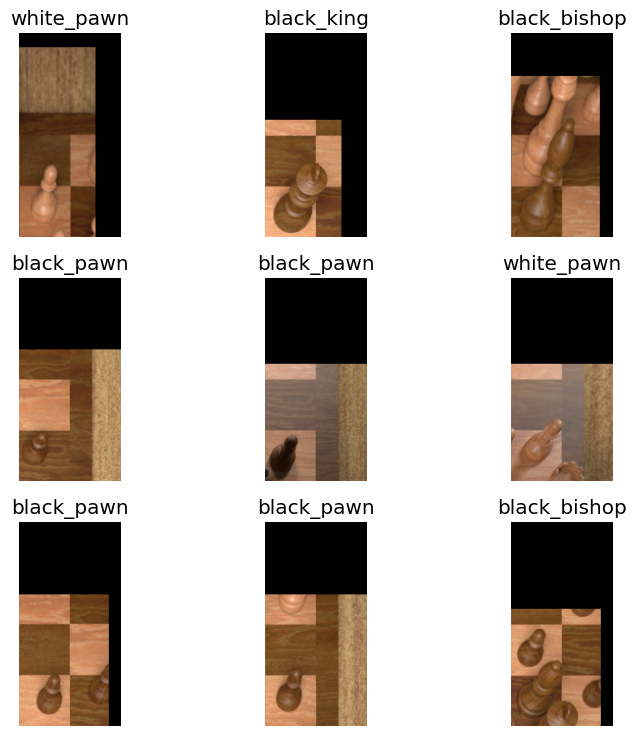

In [ ]:
# Crear el DataBlock para clasificación binaria
dblock_cnn_100_piece_classifier = DataBlock(
    blocks=(ImageBlock, CategoryBlock),  # Imágenes y categorías
    get_items=get_image_files,  # Obtener las imágenes de los directorios
    get_y=parent_label,  # Etiquetas basadas en los nombres de las carpetas (piece_classifier/empty)
    item_tfms=Resize((200, 100), method='squish'),
    splitter=GrandparentSplitter(train_name='train', valid_name='val')  # Dividir entre 'train' y 'val'
)

# Crear los DataLoaders utilizando los directorios de entrenamiento y validación
dls_cnn_100_piece_classifier = dblock_cnn_100_piece_classifier.dataloaders(path, bs=32)

# Mostrar un batch de imágenes
dls_cnn_100_piece_classifier.show_batch()

Como podemos ver, tenemos ejemplos de casillas ocupadas por diferentes tipos de piezas de ambos colores, recortadas de forma que tenemos información contextual alrededor.

Ahora definimos el propio modelo, creamos el Learner y enseñamos su resumen. La CNN básica tiene una arquitectura muy simple, tenemos 3 capas de convolución, 3 de MaxPooling y 3 densas en la cabecera. Usamos funciones de activación ReLU y aumentamos los canales en las capas convolucionales posteriores siguiendo la heurística bastante buena de canales que son potencias de dos. Esto nos permite aprender características más complejas en las capas superiores.

En el `Learner` usamos optimizador Adam, que es el establecido por defecto, y función de pérdida `CrossEntropyLossFlat`, que como ya sabemos es la adecuada para nuestro problema. Como métricas usaremos accuracy y F1-score ponderado (tenemos en cuenta que hay muchas más casillas vacías que ocupadas).

In [ ]:
cnn_100_pieces = nn.Sequential(

    # Capa convolucional 1
    nn.Conv2d(3, 16, 5),  # 3 canales de entrada, 16 canales de salida, kernel de 5x5
    nn.ReLU(),  # Función de activación ReLU
    nn.MaxPool2d(2, 2),  # Max pooling con un tamaño de kernel de 2x2

    # Capa convolucional 2
    nn.Conv2d(16, 32, 5),  # 16 canales de entrada, 32 canales de salida, kernel de 5x5
    nn.ReLU(),  # Función de activación ReLU
    nn.MaxPool2d(2, 2),  # Max pooling con un tamaño de kernel de 2x2

    # Capa convolucional 3
    nn.Conv2d(32, 64, 3),  # 32 canales de entrada, 64 canales de salida, kernel de 3x3
    nn.ReLU(),  # Función de activación ReLU
    nn.MaxPool2d(2, 2),  # Max pooling con un tamaño de kernel de 2x2

    # Aplanado para la capa completamente conectada
    nn.Flatten(),  # Aplanamos la salida 3D a un vector 1D

    # Capas completamente conectadas (fully connected)
    nn.Linear(64 * 10 * 22, 1000),  # Capa de entrada con 64*10*22 características
    nn.ReLU(),  # Función de activación ReLU

    nn.Linear(1000, 256),  # Capa intermedia con 1000 a 256 unidades
    nn.ReLU(),  # Función de activación ReLU

    nn.Linear(256, 12)  # Capa de salida con el número de clases
)

learn_cnn_100_piece_classifier = Learner(
    dls_cnn_100_piece_classifier,
    cnn_100_pieces,
    loss_func=CrossEntropyLossFlat(),
    opt_func=Adam,
    metrics=[accuracy, F1Score(average='weighted')]
)

learn_cnn_100_piece_classifier.summary()

Sequential (Input shape: 32 x 3 x 200 x 100)
Layer (type)         Output Shape         Param #    Trainable 
                     32 x 16 x 196 x 96  
Conv2d                                    1216       True      
ReLU                                                           
____________________________________________________________________________
                     32 x 16 x 98 x 48   
MaxPool2d                                                      
____________________________________________________________________________
                     32 x 32 x 94 x 44   
Conv2d                                    12832      True      
ReLU                                                           
____________________________________________________________________________
                     32 x 32 x 47 x 22   
MaxPool2d                                                      
____________________________________________________________________________
                     32 x 64 x 

Como podemos ver, tenemos casi $14.5$ millones de parámetros y todos son entrenables. Ahora hacemos `lr_find()` para encontrar un learning rate bueno.

/usr/local/lib/python3.10/dist-packages/fastai/learner.py:53: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwargs

Best Learning Rate found: 0.0003311311302240938


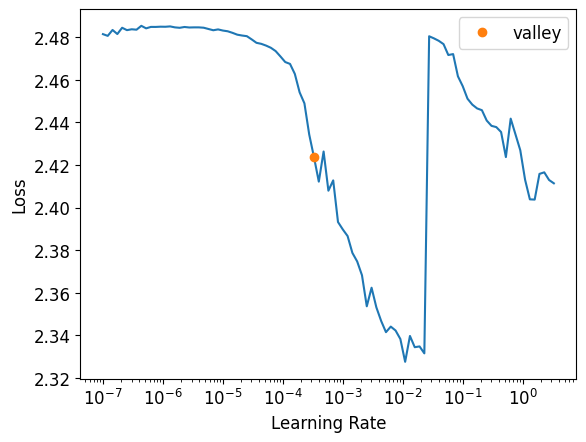

In [ ]:
lr = learn_cnn_100_piece_classifier.lr_find();
print('Best Learning Rate found:', lr[0])

Nos quedamos con `lr[0]` ya que parece razonable y entrenamos con `fit_one_cycle()`. Entrenaremos solo durante $5$ épocas para evitar sobreajuste.

In [ ]:
learn_cnn_100_piece_classifier.fit_one_cycle(
    n_epoch=5,
    lr_max=lr[0]
)

epoch,train_loss,valid_loss,accuracy,f1_score,time
0,0.677262,0.677003,0.752417,0.730275,04:42
1,0.323813,0.312244,0.887746,0.886392,04:34
2,0.176295,0.182960,0.934830,0.933809,04:30
3,0.058817,0.140021,0.954475,0.954398,04:25
4,0.030449,0.139910,0.956969,0.956842,04:24


El resultado es bastante bueno. Los métricas de accuracy y f1-score son muy similares entre sí, estando los valores de la última época alrededor del $95.68\%$ . Veamos las métricas con gráficas.

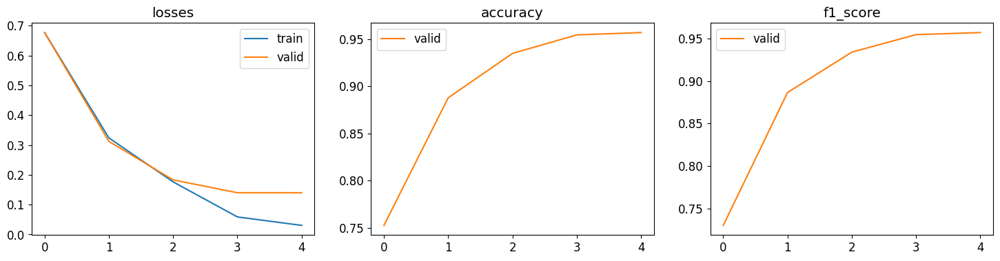

In [ ]:
learn_cnn_100_piece_classifier.recorder.plot_metrics()

Viendo la evolución de las funciones de pérdida parece que tenemos un poco de sobreajuste. Aun así el resultado obtenido es bastante bueno, ya que las métricas de validación se sitúan entorno al $95\%$. Vamos a guardar el modelo y procedemos a entrenar la Resnet18.

In [ ]:
# Export the model to the specified path
learn_cnn_100_piece_classifier.export('./piece_classifier_cnn100.pkl')

Vamos a probar también el Resnet para la clasificación de piezas. También quisimos probar con el Inception de Google pero por problemas con Fast.ai no nos fue posible ejecutar el modelo. Además, como veremos más adelante los resultados de Resnet 18 son tan buenos que no es ni necesario entrenar más modelos ya que sería una pérdida de tiempo y de unidades de cómputo.

Respecto al tamaño de las imágenes podemos ver que las redimensionamos porque nos es necesario dicho tamaño para que el modelo funcione bien porque sino las piezas del batch saldrían como mal dimensionadas y además pueden salir también recortadas de forma que el modelo no podría reconocer bien esa pieza nunca al ni siquiera parecerse a la que se supone que es.

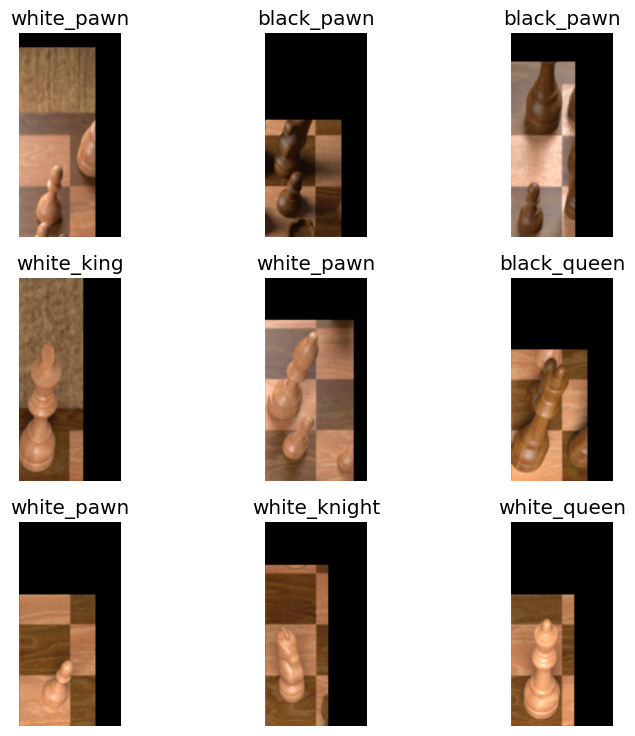

In [ ]:
# Crear el DataBlock para clasificación binaria
dblock_resnet_18_piece_classifier = DataBlock(
    blocks=(ImageBlock, CategoryBlock),  # Imágenes y categorías
    get_items=get_image_files,  # Obtener las imágenes de los directorios
    get_y=parent_label,  # Etiquetas basadas en los nombres de las carpetas (occupied/empty)
    item_tfms=Resize((448, 224), method='squish'),
    splitter=GrandparentSplitter(train_name='train', valid_name='val')  # Dividir entre 'train' y 'val'
)

# Crear los DataLoaders utilizando los directorios de entrenamiento y validación
dls_resnet_18_piece_classifier = dblock_resnet_18_piece_classifier.dataloaders(path, bs=32)

# Mostrar un batch de imágenes
dls_resnet_18_piece_classifier.show_batch()

In [ ]:
learn_resnet_18_piece_classifier = vision_learner(
    dls_resnet_18_piece_classifier,
    resnet18,
    pretrained=True,
    train_bn=False,
    loss_func=CrossEntropyLossFlat(),
    opt_func=Adam,
    metrics=[accuracy, F1Score(average='weighted')]
)

learn_resnet_18_piece_classifier.summary()

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 189MB/s]


Sequential (Input shape: 32 x 3 x 448 x 224)
Layer (type)         Output Shape         Param #    Trainable 
                     32 x 64 x 224 x 112 
Conv2d                                    9408       False     
BatchNorm2d                               128        False     
ReLU                                                           
____________________________________________________________________________
                     32 x 64 x 112 x 56  
MaxPool2d                                                      
Conv2d                                    36864      False     
BatchNorm2d                               128        False     
ReLU                                                           
Conv2d                                    36864      False     
BatchNorm2d                               128        False     
Conv2d                                    36864      False     
BatchNorm2d                               128        False     
ReLU                      

Volvemos a entrenar haciendo uso de los mismos parámetros respecto a las épocas de entrenamiento.

In [ ]:
learn_resnet_18_piece_classifier.fine_tune(
    epochs=5,
    freeze_epochs=1
)

epoch,train_loss,valid_loss,accuracy,f1_score,time
0,0.587446,0.394172,0.851887,0.850756,08:21


epoch,train_loss,valid_loss,accuracy,f1_score,time
0,0.024765,0.014025,0.994699,0.994730,13:11
1,0.016426,0.013648,0.996570,0.996570,13:05
2,0.007133,0.008694,0.998753,0.998752,13:07
3,0.000465,0.002155,0.999065,0.999064,13:04
4,0.004369,0.001627,0.999376,0.999376,13:04


Nuevamente los resultados son prácticamente perfectos obteniendo casi un $100\%$ en validación tanto en accuracy como en f1_score. Nuevamente las gráficas de métricas no tienen mucho sentido pero ya que tenemos la función la mostramos de igual manera.

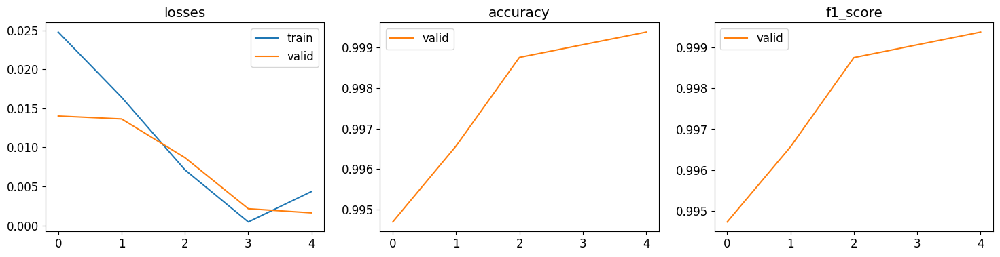

In [ ]:
learn_resnet_18_piece_classifier.recorder.plot_metrics()

Este modelo también lo guardamos en el disco y lo cargamos luego para volver a probarlo en el test luego de entrenarlo en días diferentes.

In [ ]:
# Export the model to the specified path
learn_resnet_18_piece_classifier.export('./piece_classifier_resnet18.pkl')

In [ ]:
learn_resnet_18_piece_classifier = load_learner('piece_classifier_resnet18.pkl')

In [ ]:
resize_transform = Resize((448, 224), method='squish')
files_test = get_image_files('./pieces/test')

dls_test = learn_resnet_18_piece_classifier.dls.test_dl(files_test, with_labels=True, transforms=[resize_transform])

results = compute_metrics(learn_resnet_18_piece_classifier, [dls_test], names_dl=['test'])
print_metrics(results)

Métricas para test:
  Accuracy: 0.99973
  F1-score (weighted): 0.99973
  Precision (weighted): 0.99973
  Recall (weighted): 0.99973


Podemos ver que los resultados obtenidos son casi iguales que los obtenidos en el conjunto de validación obteniendo algo menos que un $100\%$.

# 6. Pipeline completo

Ahora que hemos entrenado todos los modelos de las etapas de clasificación de ocupación y piezas vamos a crear el pipeline completo con el que realizaremos predicciones. El pipeline incluirá las tres etapas que hemos implementado hasta ahora.

In [ ]:
!mkdir models

## 6.1 Definición de pipeline

Primero creamos una función que dado un string con el nombre de la pieza devuelve una instancia de `chess.Piece`. Esto lo hacemos porque trabajar con la librería `chess` es muy cómodo y nos ahorramos mucho trabajo relacionado con el tablero de ajedrez y sus piezas.

In [ ]:
def name_to_piece(name: str) -> chess.Piece:
    """Convert the name of a piece to an instance of :class:`chess.Piece`.

    Args:
        name (str): the name of the piece

    Returns:
        chess.Piece: the instance of :class:`chess.Piece`
    """
    # Separo color de la pieza en el string
    color, piece_type = name.split("_")
    # Si color es blanco
    color = color == "white"
    # Obtengo instancia de chess.Piece
    piece_type = chess.PIECE_NAMES.index(piece_type)
    return chess.Piece(piece_type, color)

Ahora creamos el pipeline, definiendo para eso una clase `ChessRecognizer`. Esta se puede instanciar con el modelo que queramos usar para las etapas de ocupación y clasificación y después podemos hacer predicciones usando el método `predict()`, que devuelve una instancia de `chess.Board` y las esquinas del tablero. Como hemos dicho, es más cómodo usar `chess`, por eso trabajamos con el tablero de esta librería.

In [ ]:
class ChessRecognizer:
    """A class implementing the entire chess inference pipeline.

    Once you create an instance of this class, the CNNs are loaded into memory (possibly the GPU if available), so if you want to perform multiple inferences, they should all use one instance of this class for performance purposes.
    """
    # Lista de casillas del tablero y path a la carpeta con los modelos entrenados
    _squares = list(chess.SQUARES)
    _PATH = './models'

    # Constructor
    def __init__(self, modelo):
        """Constructor.

        Args:
            classifiers_folder (Path, optional): the path to the classifiers (supplying a different path is especially useful because the transfer learning classifiers are located at ``models://transfer_learning``). Defaults to ``models://``.
        """
        # Cargo los modelos entrenados
        self._occupancy_model = self._load_classifier_occupancy(modelo)
        self._pieces_model = self._load_classifier_pieces(modelo)
        # Convertimos las clases de salida del modelo de piezas en chess.Piece
        self._piece_classes =  np.array(list(map(name_to_piece, self._pieces_model.dls.vocab)))

        # Definimos dimensiones de entrada según modelo
        if modelo == 'cnn':
            self._insize = (200,100)
        elif modelo == 'resnet18':
            self._insize = (448,224)

    # Método para cargar modelo de ocupación
    @classmethod
    def _load_classifier_occupancy(cls, modelo):
        loaded_learn = load_learner(f'{cls._PATH}/{modelo}.occupancy')
        return loaded_learn
    # Método para cargar modelo de piezas
    @classmethod
    def _load_classifier_pieces(cls, modelo):
        loaded_learn = load_learner(f'{cls._PATH}/{modelo}.pieces')
        return loaded_learn

    # Método para clasificar por ocupación
    def _classify_occupancy(self, img: np.ndarray, turn: chess.Color, corners: np.ndarray) -> np.ndarray:
        # Deformamos tablero
        warped = warp_chessboard_image_occupancy(img, corners)
        # Extraemos imágenes de cada casilla usando nuestra función de recorte (ocupación)
        square_imgs = map(functools.partial(crop_square_occupancy, warped, turn=turn), self._squares)
        square_imgs = list(square_imgs)
        # Resize para la entrada del modelo
        resize_transform = Resize(self._insize[1])

        # Creamos dataloader de test y hacemos predicción
        dls_test = self._occupancy_model.dls.test_dl(square_imgs, with_labels = False, transforms=[resize_transform])
        preds = self._occupancy_model.get_preds(dl=dls_test)
        # Array con booleanos con la ocupación de las casillas
        occupancy = preds[0].argmax(axis=-1) == 1
        occupancy = occupancy.cpu().numpy()

        return occupancy

    # Método para clasificar por piezas
    def _classify_pieces(self, img: np.ndarray, turn: chess.Color, corners: np.ndarray, occupancy: np.ndarray) -> np.ndarray:
        # Determinamos casillas ocupadas (hecho por _classify_occupancy)
        occupied_squares = np.array(self._squares)[occupancy]
        # Deformamos tablero
        warped = warp_chessboard_image_piece_classifier(img, corners)
        # # Extraemos imágenes de cada casilla usando nuestra función de recorte (piezas)
        piece_imgs = map(functools.partial(crop_square_piece_classifier, warped, turn=turn), occupied_squares)
        piece_imgs = list(piece_imgs)
        # Resize para la entrada del modelo
        resize_transform = Resize(self._insize)

        # Creamos dataloader de test y hacemos predicción
        dls_test = self._pieces_model.dls.test_dl(piece_imgs, with_labels = False, transforms=[resize_transform])
        preds = self._pieces_model.get_preds(dl=dls_test)
        # Obtenemos piezas
        pieces = preds[0].argmax(axis=-1).cpu().numpy()
        pieces = self._piece_classes[pieces]
        # Vector con 64 casillas, cada una con la pieza o None, si no la hay
        all_pieces = np.full(len(self._squares), None, dtype=object)
        all_pieces[occupancy] = pieces
        return all_pieces

    def predict(self, img: np.ndarray, turn: chess.Color = chess.WHITE) -> typing.Tuple[chess.Board, np.ndarray]:
        # Encontramos las esquinas con nuestro detector de tablero
        corners = find_corners(img)
        # Clasificamos por ocupación
        occupancy = self._classify_occupancy(img, turn, corners)
        # Clasificamos por pieza
        pieces = self._classify_pieces(img, turn, corners, occupancy)

        # Creamos instancia de chess.Board
        board = chess.Board()
        board.clear_board()
        # Rellenamos el tablero con las piezas que hemos detectado
        for square, piece in zip(self._squares, pieces):
             if piece:
                 board.set_piece_at(square, piece)

        return board, corners

Ahora veamos un ejemplo de tablero con el cual haremos una predicción.

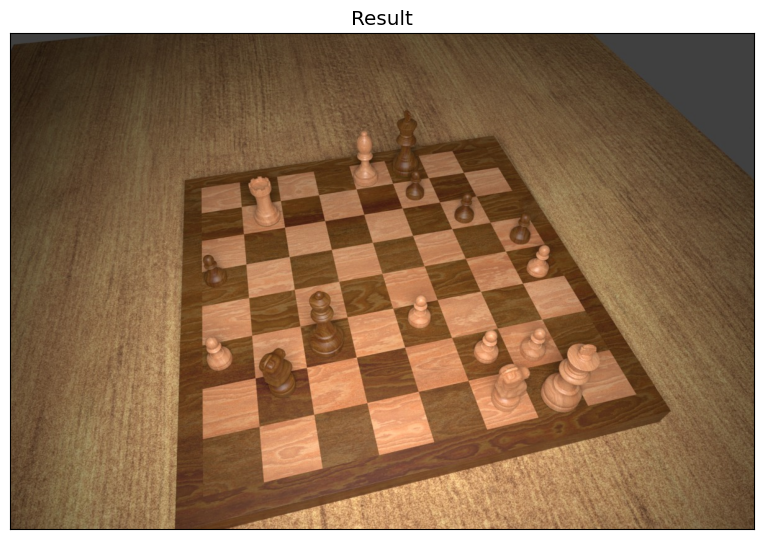

In [ ]:
ejemplo = readIm('/content/drive/My Drive/Colab Notebooks/VC/Proyecto/tablero.jpeg')
displayIm(ejemplo, factor=1.5)

Creamos el pipeline usando el modelo resnet18, hacemos la predicción y visualizamos el tablero con la librería `chess`.

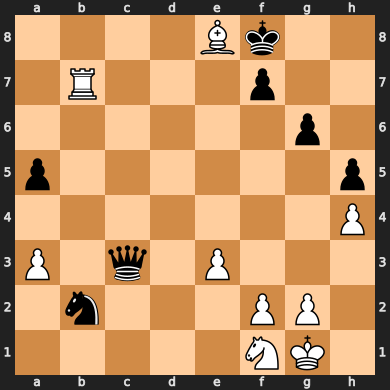

In [ ]:
pipeline = ChessRecognizer('resnet18')
a, b = pipeline.predict(ejemplo)

a

Efectivamente, vemos que la predicción se ha realizado y que además es totalmente correcta.

## 6.2 Evaluación de pipeline

Recuperamos los tableros del dataset para evaluar el rendimiento de nuestro Pipeline (es decir, Identificación de Esquinas + Clasificador de Ocupación + Clasificador de Piezas) en conjunto:

In [ ]:
!unzip "$path"/osfstorage-archive.zip

Se han truncado las últimas 5000 líneas del flujo de salida.
  inflating: train/2260.png          
  inflating: train/0300.json         
  inflating: train/2274.png          
  inflating: train/0463.png          
  inflating: train/1796.png          
  inflating: train/4188.png          
  inflating: train/4590.json         
  inflating: train/2501.json         
  inflating: train/1966.png          
  inflating: train/3340.png          
  inflating: train/1403.json         
  inflating: train/2704.png          
  inflating: train/4413.png          
  inflating: train/0357.json         
  inflating: train/2076.png          
  inflating: train/4197.json         
  inflating: train/0584.json         
  inflating: train/2556.json         
  inflating: train/0992.json         
  inflating: train/4528.json         
  inflating: train/3220.png          
  inflating: train/2393.json         
  inflating: train/2664.png          
  inflating: train/1386.png          
  inflating: train/2055.jso

Crearemos en primer lugar tres funciones para medir los errores del pipeline completo, los errores del clasificador de ocupación y los del clasificador de piezas.

Estas tres funciones recibirán el tablero con las piezas predichas y el tablero extraído del archivo JSON.

Las funciones son las siguientes:
- `_get_num_mistakes` : Cuenta el número de casillas en las que los dos tableros no coinciden.
- `_get_num_occupancy_mistakes` : Comprueba que las casillas que están ocupadas (y no ocupadas) coinciden en ambos tableros.
- `_get_num_piece_mistakes` : De las casillas ocupadas en ambos tableros, se cuenta el número de casillas en las que no coinciden las piezas entre los tableros.

In [ ]:
# Número de casillas en las que los dos tableros no coinciden
def _get_num_mistakes(groundtruth: chess.Board, predicted: chess.Board) -> int:

    # Piezas de ambos tableros
    groundtruth_map = groundtruth.piece_map()
    predicted_map = predicted.piece_map()

    # .get(i,None) devuelve la pieza si hay pieza y None si no hay
    # Si no coinciden suma 1
    # Si coinciden suma 0
    return sum(0 if groundtruth_map.get(i, None) == predicted_map.get(i, None) else 1
               for i in chess.SQUARES)


def _get_num_occupancy_mistakes(groundtruth: chess.Board, predicted: chess.Board) -> int:
    groundtruth_map = groundtruth.piece_map()
    predicted_map = predicted.piece_map()

    # Compara si ambos son None (casilla sin pieza) o si son algo distinto (casilla con pieza)
    # Si no coinciden suma 1
    # Si coinciden suma 0
    return sum(0 if (i in groundtruth_map) == (i in predicted_map) else 1
               for i in chess.SQUARES)


def _get_num_piece_mistakes(groundtruth: chess.Board, predicted: chess.Board) -> int:
    groundtruth_map = groundtruth.piece_map()
    predicted_map = predicted.piece_map()

    # Nos quedamos con las casillas ocupadas en ambos tableros y se comparan las piezas en cada casilla
    # Si no coinciden suma 1
    # Si coinciden suma 0
    squares = filter(
        lambda i: i in groundtruth_map and i in predicted_map, chess.SQUARES)
    return sum(0 if (groundtruth_map.get(i) == predicted_map.get(i)) else 1
               for i in squares)

Calcularemos también la matriz de confusión del clasificador final. Para ello, consideraremos como clases las distintas piezas y una clase adicional que representará la casilla vacía.

Las clases estarán representadas por la primera letra de su nombre en inglés (salvo el caballo que se representará con la letra N). Las piezas blancas serán representadas con letras mayúsculas y las negras con letras minúsculas. La casilla vacía se representará con la palabra reservada `None`.

In [ ]:
categories = [ "P", "N", "B", "R", "Q", "K", "p", "n", "b", "r", "q", "k", None]

def _get_category(piece: typing.Union[chess.Piece, None]) -> str:
    if piece is None:
        return None
    return piece.symbol()

def _get_confusion_matrix(predicted: chess.Board, actual: chess.Board) -> np.ndarray:

    matrix = np.zeros((len(categories), len(categories)), dtype=np.int32)

    # Por cada casilla
    for square in chess.SQUARES:

        # Calculamos la clase que se ha predicho y la clase real
        pred = _get_category(predicted.piece_at(square))
        act = _get_category(actual.piece_at(square))

        # Aumentamos en 1 la posición correspondiente en la matriz
        matrix[categories.index(pred), categories.index(act)] += 1

    return matrix

def imprimir_matriz_confusion(matriz_confusion, titulos_clases):
    """
    Imprime y visualiza la matriz de confusión con títulos de clases.

    Parámetros:
    - matriz_confusion: Matriz de confusión (numpy array o lista de listas).
    - titulos_clases: Lista de nombres de las clases (por ejemplo, ['Clase 0', 'Clase 1']).
    """
    # Verificar que la matriz sea un array de NumPy
    cm = np.array(matriz_confusion)

    # Crear el gráfico de la matriz de confusión usando Seaborn
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=titulos_clases, yticklabels=titulos_clases)

    # Agregar etiquetas y título
    plt.xlabel('Predicciones')
    plt.ylabel('Realidad')
    plt.title('Matriz de Confusión')

    # Mostrar el gráfico
    plt.show()

Implementamos ya la función que, dada una carpeta con imágenes de tableros, calcula distintas métricas de error, a partir de las funciones implementadas anteriormente.

En concreto, se mostrarán las siguientes métricas:
-  **Número medio de cuadrados incorrectos por tablero**: Se calcula el número de errores cometidos entre todos los tableros y se divide entre el número de tableros.
- **Porcentaje de tableros predichos sin errores**
- **Porcentaje de tableros predichos con 1 error o menos**
- **Tasa de error por cuadrado**: Se calcula el número de errores cometidos entre todos los tableros y se divide entre el número de casillas.
- **Accuracy del detector de esquinas**: Siguiendo el mismo criterio utilizado en la evaluación del detector de esquinas, se calcula la precisión de la detección de esquinas.
- **Accuracy del clasificador de ocupación por casilla**: Porcentaje de casillas identificadas correctamente como vacías u ocupadas respecto al total de casillas.
- **Accuracy del clasificador de piezas por casilla**: Porcentaje de piezas identificadas correctamente como vacías u ocupadas respecto al total de casillas.

In [ ]:
def evaluate(recognizer: ChessRecognizer, dataset_folder: Path):
    """Perform the performance evaluation, saving the results to a CSV output file.

    Args:
        recognizer (ChessRecognizer): the instance of the chess recognition pipeline
        dataset_folder (Path): the folder of the dataset to evaluate
    """

    # Inicializamos a 0
    total_mistakes = 0
    total_incorrect_corners = 0
    total_occupancy_mistakes = 0
    total_piece_mistakes = 0

    total_no_mistakes_board = 0
    total_one_mistake_board = 0

    matrix = np.zeros((len(categories), len(categories)), dtype=np.int32)

    # Número de archivos
    count = 0

    # Por cada imagen en la carpeta
    for i, img_file in enumerate(dataset_folder.glob("*.png")):

        # Recuperamos el fen del .json correspondiente para obtener la configuración
        # real del tablero
        json_file = img_file.parent / (img_file.stem + ".json")
        with json_file.open("r") as f:
            label = json.load(f)

        img = cv2.imread(str(img_file))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        groundtruth_board = chess.Board(label["fen"])
        groundtruth_corners = sort_corner_points(np.array(label["corners"]))

        # Realizamos la predicción con nuestro modelo
        predicted_board, predicted_corners = recognizer.predict(img, label["white_turn"])

        # Comparamos la predicción con la configuración real
        num_mistakes = _get_num_mistakes(groundtruth_board, predicted_board)

        if num_mistakes == 0:
            total_no_mistakes_board += 1

        if num_mistakes <= 1:
            total_one_mistake_board += 1

        total_mistakes += num_mistakes
        total_incorrect_corners += np.sum(np.linalg.norm(groundtruth_corners - predicted_corners, axis=-1) > (10/1200*img.shape[1]))
        total_occupancy_mistakes += _get_num_occupancy_mistakes(groundtruth_board, predicted_board)
        total_piece_mistakes += _get_num_piece_mistakes(groundtruth_board, predicted_board)

        matrix += _get_confusion_matrix(predicted_board, groundtruth_board)

        # Número de archivos leídos + 1
        count += 1


    # Mostramos los resultados
    print(f'Mean number of incorrect squares per board = {total_mistakes/count:.2f}')
    print(f'Percentage of boards predicted with no mistakes = {100*total_no_mistakes_board/count:.2f}%')
    print(f'Percentage of boards predicted with ≤1 mistake = {100*total_one_mistake_board/count:.2f}%')
    print(f'Per-square error rate = {100*total_mistakes/(count*64):.2f}%')
    print(f'Corner detection accuracy = {100*(1 - total_incorrect_corners/(4*count)):.2f}%')
    print(f'Per-square occupancy classification accuracy = {100*(1- total_occupancy_mistakes/(64*count)):.2f}%')
    print(f'Per-square piece classification accuracy = {100*(1 - total_piece_mistakes/(64*count)):.2f}%')
    imprimir_matriz_confusion(matrix, titulos_clases=categories)


Comprobamos el funcionamiento del modelo con el que se han obtenido los mejores resultados (ResNet18 en ocupación y ResNet18 en clasificación de piezas) con los tableros del conjunto de validación:

Mean number of incorrect squares per board = 0.01
Percentage of boards predicted with no mistakes = 99.32%
Percentage of boards predicted with ≤1 mistake = 100.00%
Per-square error rate = 0.01%
Corner detection accuracy = 100.00%
Per-square occupancy classification accuracy = 100.00%
Per-square piece classification accuracy = 99.99%


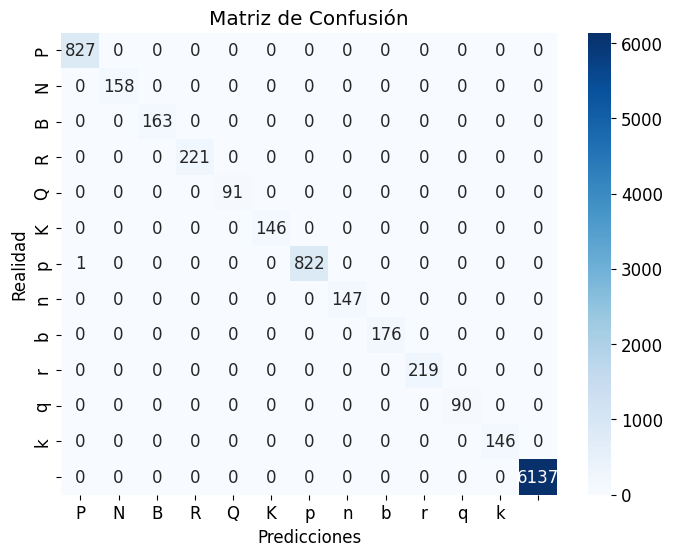

In [ ]:
evaluate(pipeline, Path('./val'))

Los resultados son muy buenos. El modelo predice correctamente de forma completa más del 99% de tableros, y el 100% si admitimos un error. En media, el modelo completo no llega a cometer ni siquiera una casilla de error de media.

Los tres modelos (detección de esquinas, ocupación y clasificación de piezas) obtienen resultados muy buenos, obteniendo prácticamente el 100% de accuracy.

La matriz de confusión nos confirma que la clasificación es prácticamente perfecta. Salvo un error en la clasificación de un peón, donde el clasificador de piezas se equivoca en el color del peón, la clasificación es perfecta.

Finalmente, probamos el modelo implementado en el conjunto test:

Mean number of incorrect squares per board = 0.02
Percentage of boards predicted with no mistakes = 97.66%
Percentage of boards predicted with ≤1 mistake = 100.00%
Per-square error rate = 0.04%
Corner detection accuracy = 100.00%
Per-square occupancy classification accuracy = 99.97%
Per-square piece classification accuracy = 100.00%


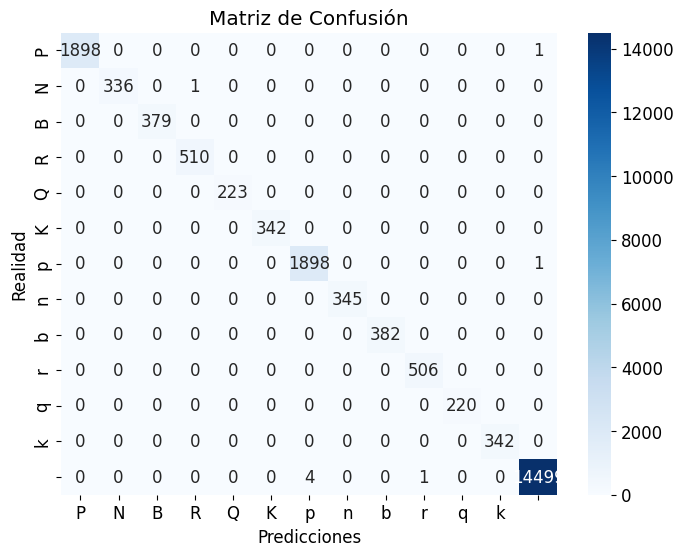

In [ ]:
evaluate(pipeline, Path('./test'))

Los resultados son muy similares. Se obtiene más del 98% de tableros clasificados correctamente en su totalidad. En todos los tableros se comete un error o menos.

En la matriz de confusión se observa que en este caso los pocos errores cometidos se deben al clasificador de ocupación. Resulta curioso que en la tarea de ocupación, que quizás parecía más sencilla que la clasificación de piezas, en test se obtiene una precisión ligeramente inferior. Esto parece indicar que, en algunas ocasiones, las piezas alrededor de la casilla que queremos clasificar, pueden dificultar la tarea.

Los errores por casilla son prácticamente 0, y los tres modelos superan el 99% de accuracy, obteniendo un 100% tanto el detector de esquinas como el detector de piezas, lo cual indica el buen funcionamiento del modelo.

Podemos concluir, en base a los resultados, que el funcionamiento del modelo es excelente.